# I. What drives asset prices? Causality and cointegration

In [117]:
import math
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

import scipy as sp 
import seaborn as sns
import xlsxwriter

import math
from math import exp, sqrt, log

%matplotlib inline

from scipy import stats

import pylab
import statistics 

import statsmodels.api as sm
from statsmodels.regression.linear_model import OLS
from statsmodels.tsa.stattools import adfuller
from statsmodels.stats.stattools import jarque_bera
from statsmodels.stats.stattools import durbin_watson


import statsmodels.formula.api as smf
import statsmodels.stats.api as sms
from statsmodels.compat import lzip

import xlsxwriter
#from statsmodels.tsa.ar_model import AR
#from statsmodels.tsa.stattools import grangercausalitytests
#from statsmodels.tsa.tsatools import (lagmat, add_trend)

import itertools



# Import Data from Refinitiv

We have first done a data collection and assembly.  The MSCI World served as the basis for the data. In addition, we supplemented this basis with two further factors. Firstly, the GICS sectors were added, and secondly, the market capitalization is also decisive for the selection. The data were sorted by GICS sectors and then by market capitalization. For each GICS sector (total of 11 sectors), we used the 3 companies with the largest market capitalization. In addition, each country may only appear once per GICS sector. In total, we have 33 companies. As data basis we use the prices on a daily basis, starting from May 01, 2012 until May 01, 2022.

In [118]:
import eikon as ek

ek.set_app_key('xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx')

# Definition of Instruments (= ticker of the 33 stocks)

In [119]:
Instrument = ['GOOGL.O', '9984.T', 'DTEGn.DE', 'AMZN.O', 'LVMH.PA', '7203.T', 'NESN.S', 'WMT.N', 'OREP.PA', 'XOM.N', 'SHEL.L', 'TTEF.PA', 'BRKb.N', 'RY.TO', 'CBA.AX', 'UNH.N', 'RO.S', 'NOVOb.CO', 'UPS.N', 'SIEGn.DE', 'SCHN.PA', 'AAPL.O', 'ASML.AS', 'SAPG.DE', 'LIN.N', 'BHP.AX', 'RIO.L', 'AMT.N', '0016.HK', 'VNAn.DE', 'NEE.N', 'ENEI.MI', 'IBE.MC']
StockPrices = ['GOOGL.O', '9984.T', 'DTEGn.DE', 'AMZN.O', 'LVMH.PA', '7203.T', 'NESN.S', 'WMT.N', 'OREP.PA', 'XOM.N', 'SHEL.L', 'TTEF.PA', 'BRKb.N', 'RY.TO', 'CBA.AX', 'UNH.N', 'RO.S', 'NOVOb.CO', 'UPS.N', 'SIEGn.DE', 'SCHN.PA', 'AAPL.O', 'ASML.AS', 'SAPG.DE', 'LIN.N', 'BHP.AX', 'RIO.L', 'AMT.N', '0016.HK', 'VNAn.DE', 'NEE.N', 'ENEI.MI', 'IBE.MC']

# Import the data and creating the returns of each stock

In [120]:
StockPrices_raw = pd.DataFrame()
try:
    itemName=StockPrices
    dateStart="2012-05-01"
    dateEnd="2022-05-01"

    #Create Loop to inport all stock closing prices:
    for y in range(0,len(StockPrices)):
        data_input = ek.get_timeseries(StockPrices[y],fields=["Close"], start_date = dateStart , 
                                    end_date = dateEnd , interval='daily', corax = 'adjusted' )
        data_input['Instrument'] = StockPrices[y]
        StockPrices_raw = StockPrices_raw.append(data_input)
except ek.EikonError as ex:
    print('Eikon Error')
    print(ex)
except Exception as ex:
    print(ex)

StockPrices_raw = StockPrices_raw.sort_values(['Instrument','Date'])
StockPrices_raw["Return"] = StockPrices_raw.groupby("Instrument")['CLOSE'].apply(lambda x: np.log(x) - np.log(x.shift(1)))
StockPrices_raw = StockPrices_raw.reset_index()
StockPrices_raw['Date'] = pd.to_datetime(StockPrices_raw['Date']).dt.date
liste_SQL_futures = StockPrices_raw.values.tolist()
StockPrices_raw

,Date,CLOSE,Instrument,Return
0,2012-05-02,94.3,0016.HK,<NA>
1,2012-05-03,94.3,0016.HK,0.0
2,2012-05-04,92.6,0016.HK,-0.018192
3,2012-05-07,90.25,0016.HK,-0.025706
4,2012-05-08,89.0,0016.HK,-0.013947
...,...,...,...,...
82861,2022-04-25,82.26,XOM.N,-0.034295
82862,2022-04-26,82.29,XOM.N,0.000365
82863,2022-04-27,84.64,XOM.N,0.028157
82864,2022-04-28,87.2,XOM.N,0.029797


# Calculation of the continuous return 
For graphical representation and better comprehensibility, we show the return over the entire period. 


In [121]:
StockPrices_raw['Return_cont'] = StockPrices_raw.groupby("Instrument")['Return'].cumsum()
StockPrices_raw

,Date,CLOSE,Instrument,Return,Return_cont
0,2012-05-02,94.3,0016.HK,<NA>,<NA>
1,2012-05-03,94.3,0016.HK,0.0,0.0
2,2012-05-04,92.6,0016.HK,-0.018192,-0.018192
3,2012-05-07,90.25,0016.HK,-0.025706,-0.043898
4,2012-05-08,89.0,0016.HK,-0.013947,-0.057845
...,...,...,...,...,...
82861,2022-04-25,82.26,XOM.N,-0.034295,-0.056483
82862,2022-04-26,82.29,XOM.N,0.000365,-0.056118
82863,2022-04-27,84.64,XOM.N,0.028157,-0.027961
82864,2022-04-28,87.2,XOM.N,0.029797,0.001837


# Indexing

In [122]:
StockPrices_raw = StockPrices_raw.set_index('Date', pd.to_datetime)
StockPrices_raw.head(10)

,CLOSE,Instrument,Return,Return_cont
Date,,,,
2012-05-02,94.3,0016.HK,<NA>,<NA>
2012-05-03,94.3,0016.HK,0.0,0.0
2012-05-04,92.6,0016.HK,-0.018192,-0.018192
2012-05-07,90.25,0016.HK,-0.025706,-0.043898
2012-05-08,89.0,0016.HK,-0.013947,-0.057845
2012-05-09,89.8,0016.HK,0.008949,-0.048896
2012-05-10,89.25,0016.HK,-0.006144,-0.05504
2012-05-11,88.55,0016.HK,-0.007874,-0.062914
2012-05-14,87.85,0016.HK,-0.007937,-0.07085


In [123]:
StockPrices_raw.info

<bound method DataFrame.info of             CLOSE Instrument    Return  Return_cont
Date                                               
2012-05-02   94.3    0016.HK      <NA>         <NA>
2012-05-03   94.3    0016.HK       0.0          0.0
2012-05-04   92.6    0016.HK -0.018192    -0.018192
2012-05-07  90.25    0016.HK -0.025706    -0.043898
2012-05-08   89.0    0016.HK -0.013947    -0.057845
...           ...        ...       ...          ...
2022-04-25  82.26      XOM.N -0.034295    -0.056483
2022-04-26  82.29      XOM.N  0.000365    -0.056118
2022-04-27  84.64      XOM.N  0.028157    -0.027961
2022-04-28   87.2      XOM.N  0.029797     0.001837
2022-04-29  85.25      XOM.N -0.022616     -0.02078

[82866 rows x 4 columns]>

In [124]:
#Set a new Dataframe "Prices" with the Pivot Table output from the raw data
Prices = pd.pivot_table(StockPrices_raw,index='Date', columns='Instrument')
print(Prices)

             CLOSE                                                         \
Instrument 0016.HK  7203.T  9984.T     AAPL.O   AMT.N   AMZN.O    ASML.AS   
Date                                                                        
2012-05-01    <NA>   638.0  1199.0  20.790336   65.43   230.04       <NA>   
2012-05-02    94.3   641.0  1200.5  20.927836   65.92   230.25  39.466114   
2012-05-03    94.3    <NA>    <NA>  20.779265   67.05   229.45  39.445487   
2012-05-04    92.6    <NA>    <NA>   20.18748   66.44   223.99   38.46051   
2012-05-07   90.25   622.0  1185.5  20.338551   67.25   225.16  38.873065   
...            ...     ...     ...        ...     ...      ...        ...   
2022-04-25    93.4  2190.0  4989.0     162.88  259.52  2921.48      547.7   
2022-04-26    93.4  2180.0  5195.0      156.8  254.82  2787.82      529.4   
2022-04-27   91.75  2165.5  5182.0     156.57  252.85  2763.34      528.7   
2022-04-28   91.85  2235.5  5269.0     163.64  252.18  2891.93      548.7   

In [125]:
Prices.tail(10)

CLOSE                                                   \
Instrument 0016.HK  7203.T  9984.T  AAPL.O   AMT.N   AMZN.O ASML.AS   
Date                                                                  
2022-04-18    <NA>  2155.0  5653.0  165.07  253.91   3055.7    <NA>   
2022-04-19    95.3  2177.0  5547.0   167.4  258.77  3162.31   561.6   
2022-04-20    94.4  2258.5  5627.0  167.23  267.59  3079.96   591.4   
2022-04-21    94.6  2250.0  5579.0  166.42  266.75  2965.92   584.0   
2022-04-22   94.25  2210.0  5411.0  161.79   261.9   2887.0   571.2   
2022-04-25    93.4  2190.0  4989.0  162.88  259.52  2921.48   547.7   
2022-04-26    93.4  2180.0  5195.0   156.8  254.82  2787.82   529.4   
2022-04-27   91.75  2165.5  5182.0  156.57  252.85  2763.34   528.7   
2022-04-28   91.85  2235.5  5269.0  163.64  252.18  2891.93   548.7   
2022-04-29   90.95    <NA>    <NA>  157.65  241.02  2485.63   548.0   

                                       ... Return_cont                      \
Instrument     BHP.AX  BRKb.N  CBA.AX  ...     SAPG.DE   SCHN.PA    SHEL.L   
Date                                   ...                                   
2022-04-18       <NA>  346.65    <NA>  ...        <NA>      <NA>      <NA>   
2022-04-19  47.342568   348.5  107.01  ...    0.667243  1.101779  0.006529   
2022-04-20   46.56792  348.82  107.24  ...    0.680634  1.119247 -0.002488   
2022-04-21   45.14328   343.6  108.35  ...    0.691541  1.147608  0.003833   
2022-04-22  43.175496  335.56  105.37  ...    0.671351  1.112943 -0.011587   
2022-04-25       <NA>  336.95    <NA>  ...    0.652417  1.089483 -0.064855   
2022-04-26  40.655664  330.65  104.75  ...    0.640015  1.071483 -0.041274   
2022-04-27  40.967304  329.58   103.0  ...    0.643921  1.065017 -0.038218   
2022-04-28  42.757008  331.27  103.23  ...    0.663015  1.081539 -0.012959   
2022-04-29  42.748104  322.83  103.88  ...    0.671248  1.079942 -0.018466   

                                                                        \
Instrument  SIEGn.DE   TTEF.PA     UNH.N     UPS.N   VNAn.DE     WMT.N   
Date                                                                     
2022-04-18      <NA>      <NA>  2.235216  0.869247      <NA>  0.970363   
2022-04-19  0.665015  0.269923  2.241971  0.887933  0.916137  0.981654   
2022-04-20  0.687305  0.263353  2.257308  0.886568  0.928581  0.994135   
2022-04-21     0.714  0.265795  2.241488  0.877972  0.933868  0.995638   
2022-04-22  0.674532  0.238273  2.210305  0.869194  0.915114  0.976631   
2022-04-25  0.655233  0.197333  2.216677  0.882411  0.921997   0.97714   
2022-04-26   0.62938  0.213665  2.196466  0.847043  0.913065  0.966636   
2022-04-27  0.638891  0.222009  2.196524  0.865179  0.921997  0.959787   
2022-04-28  0.657645  0.257917  2.216964  0.885149  0.927066  0.972478   
2022-04-29  0.670634  0.267385  2.186234  0.830129  0.886833  0.951649   

                      
Instrument     XOM.N  
Date                  
2022-04-18    0.0172  
2022-04-19  0.008238  
2022-04-20  0.010514  
2022-04-21 -0.000115  
2022-04-22 -0.022188  
2022-04-25 -0.056483  
2022-04-26 -0.056118  
2022-04-27 -0.027961  
2022-04-28  0.001837  
2022-04-29  -0.02078  

[10 rows x 99 columns]

In [126]:
Prices.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2601 entries, 2012-05-01 to 2022-04-29
Data columns (total 99 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   (CLOSE, 0016.HK)         2463 non-null   Float64
 1   (CLOSE, 7203.T)          2444 non-null   Float64
 2   (CLOSE, 9984.T)          2444 non-null   Float64
 3   (CLOSE, AAPL.O)          2517 non-null   Float64
 4   (CLOSE, AMT.N)           2517 non-null   Float64
 5   (CLOSE, AMZN.O)          2517 non-null   Float64
 6   (CLOSE, ASML.AS)         2558 non-null   Float64
 7   (CLOSE, BHP.AX)          2532 non-null   Float64
 8   (CLOSE, BRKb.N)          2517 non-null   Float64
 9   (CLOSE, CBA.AX)          2528 non-null   Float64
 10  (CLOSE, DTEGn.DE)        2529 non-null   Float64
 11  (CLOSE, ENEI.MI)         2535 non-null   Float64
 12  (CLOSE, GOOGL.O)         2517 non-null   Float64
 13  (CLOSE, IBE.MC)          2556 non-null   Float64
 14  (CLOSE, LIN.N)

# Checking whether the data via the API matches the Excel download

As a check of our data from the API, we make an Excel download and compare the data sets

In [127]:
data_excel = pd.read_excel('Aktienliste_für_Import.xlsx')
data_excel.head(10)

,Date,0016.HK,7203.T,9984.T,AAPL.O,AMT.N,AMZN.O,ASML.AS,BHP.AX,BRKb.N,...,SAPG.DE,SCHN.PA,SHEL.L,SIEGn.DE,TTEF.PA,UNH.N,UPS.N,VNAn.DE,WMT.N,XOM.N
0,2012-05-01,NaN,638.0,1199.0,20.790336,65.43,230.04,NaN,NaN,81.46,...,NaN,NaN,NaN,NaN,NaN,57.13,78.47,NaN,59.07,87.04
1,2012-05-02,94.30,641.0,1200.5,20.927836,65.92,230.25,NaN,NaN,81.13,...,NaN,NaN,NaN,NaN,NaN,56.66,78.42,NaN,59.01,86.20
2,2012-05-03,94.30,NaN,NaN,20.779265,67.05,229.45,NaN,NaN,81.26,...,NaN,NaN,NaN,NaN,NaN,55.72,78.07,NaN,58.99,85.65
3,2012-05-04,92.60,NaN,NaN,20.187480,66.44,223.99,NaN,NaN,80.94,...,NaN,NaN,NaN,NaN,NaN,54.72,77.73,NaN,58.70,84.57
4,2012-05-05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,2012-05-06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,2012-05-07,90.25,622.0,1185.5,20.338551,67.25,225.16,NaN,NaN,82.47,...,NaN,NaN,NaN,NaN,NaN,55.25,77.80,NaN,59.19,84.48
7,2012-05-08,89.00,629.0,1197.0,20.292123,67.75,223.90,NaN,NaN,82.22,...,NaN,NaN,NaN,NaN,NaN,55.82,77.66,NaN,59.05,84.02
8,2012-05-09,89.80,629.0,1223.5,20.327837,67.00,222.98,NaN,NaN,81.43,...,NaN,NaN,NaN,NaN,NaN,55.22,77.15,NaN,59.03,83.31
9,2012-05-10,89.25,634.0,1207.5,20.375694,67.54,226.69,NaN,NaN,81.78,...,NaN,NaN,NaN,NaN,NaN,55.29,76.61,NaN,59.19,82.84


In [128]:
Prices['CLOSE'].head(10)

Instrument,0016.HK,7203.T,9984.T,AAPL.O,AMT.N,AMZN.O,ASML.AS,BHP.AX,BRKb.N,CBA.AX,...,SAPG.DE,SCHN.PA,SHEL.L,SIEGn.DE,TTEF.PA,UNH.N,UPS.N,VNAn.DE,WMT.N,XOM.N
Date,,,,,,,,,,,,,,,,,,,,,
2012-05-01,<NA>,638.0,1199.0,20.790336,65.43,230.04,<NA>,27.821959,81.46,52.56461,...,<NA>,<NA>,2213.5,<NA>,<NA>,57.13,78.47,<NA>,59.07,87.04
2012-05-02,94.3,641.0,1200.5,20.927836,65.92,230.25,39.466114,28.038532,81.13,52.395528,...,49.587565,46.765,2176.0,60.23083,36.145,56.66,78.42,<NA>,59.01,86.2
2012-05-03,94.3,<NA>,<NA>,20.779265,67.05,229.45,39.445487,28.038532,81.26,52.395528,...,49.254395,46.735,2184.5,60.257037,36.16,55.72,78.07,<NA>,58.99,85.65
2012-05-04,92.6,<NA>,<NA>,20.18748,66.44,223.99,38.46051,27.868367,80.94,52.335852,...,47.857072,45.66,2142.0,59.138901,35.515,54.72,77.73,<NA>,58.7,84.57
2012-05-07,90.25,622.0,1185.5,20.338551,67.25,225.16,38.873065,26.739091,82.47,51.778876,...,47.842154,46.59,<NA>,58.999134,35.95,55.25,77.8,<NA>,59.19,84.48
2012-05-08,89.0,629.0,1197.0,20.292123,67.75,223.9,37.996385,26.824174,82.22,51.798768,...,46.986853,44.545,2085.0,58.064442,34.905,55.82,77.66,<NA>,59.05,84.02
2012-05-09,89.8,629.0,1223.5,20.327837,67.0,222.98,37.965443,26.553457,81.43,51.381036,...,47.752646,44.49,2047.0,58.440066,34.485,55.22,77.15,<NA>,59.03,83.31
2012-05-10,89.25,634.0,1207.5,20.375694,67.54,226.69,38.006698,26.777765,81.78,51.61974,...,47.742701,45.21,2050.5,59.147636,35.15,55.29,76.61,<NA>,59.19,82.84
2012-05-11,88.55,647.0,1184.0,20.239623,67.62,227.68,38.924635,26.584396,81.6,51.52028,...,48.598002,43.995,2067.0,59.636821,35.135,55.2,76.43,<NA>,59.42,83.1


The comparison between API and Excel shows us that the data is the same. So we can continue to work with the data from the API. It should be noted that both data sets have not yet been cleaned!

The Formula for the Excel-download: =@RDP.HistoricalPricing("GOOGL.O;9984.T;DTEGn.DE;AMZN.O;LVMH.PA;7203.T;NESN.S;WMT.N;OREP.PA;XOM.N;SHEL.L;TTEF.PA;BRKb;RY.TO;CBA.AX;UNH;RO.S;NOVOb.S;UPS.N;SIEGn.DE;SCHN.PA;AAPL.O;ASML.AS;SAPG.DE;LIN.N;BHP.AX;RIO.L;AMT;0016.HK;VNAn.DE;NEE;ENEI.MI;IBE.M"&"C";"TRDPRC_1";"START:01-May-2012 END:01-May-2022 SOURCE:RFV INTERVAL:P1D";;"CH:Fd RH:Timestamp";D2)

# Basic statistics - overview over the data

In [129]:
Prices['CLOSE'].describe()

Instrument,0016.HK,7203.T,9984.T,AAPL.O,AMT.N,AMZN.O,ASML.AS,BHP.AX,BRKb.N,CBA.AX,...,SAPG.DE,SCHN.PA,SHEL.L,SIEGn.DE,TTEF.PA,UNH.N,UPS.N,VNAn.DE,WMT.N,XOM.N
count,2463.000000,2444.000000,2444.000000,2517.000000,2517.000000,2517.000000,2558.000000,2532.000000,2517.000000,2528.000000,...,2529.000000,2558.000000,2528.000000,2529.000000,2558.000000,2517.000000,2517.000000,2226.000000,2517.000000,2517.000000
mean,110.394742,1365.306956,4317.494476,53.897096,147.862479,1340.606222,192.216115,27.969405,175.422789,77.641994,...,84.971707,77.676847,2008.355973,95.355045,43.557866,198.884923,117.107545,35.605124,94.064068,77.918868
std,12.536480,328.678936,1747.434900,43.682389,68.164405,1083.196306,177.037339,7.236953,59.282010,11.311970,...,24.758109,29.190060,388.174937,21.147419,5.682620,120.830529,35.685415,11.409831,27.202672,15.801290
min,80.350000,563.400000,1134.000000,13.947486,63.090000,208.220000,36.268807,12.122925,78.830000,48.456912,...,43.913737,40.105000,900.000000,54.880885,21.795000,51.000000,70.010000,15.654411,56.420000,31.450000
25%,100.000000,1207.750000,3349.500000,24.335000,92.940000,364.030000,76.030000,23.192098,131.330000,71.730000,...,59.871067,60.000000,1739.625000,81.987787,39.420000,93.610000,97.720000,27.195397,73.430000,71.750000
50%,110.900000,1354.500000,4125.250000,35.982500,126.280000,937.530000,119.275000,27.490012,167.440000,76.876290,...,86.763321,67.845000,2107.000000,90.434467,44.155000,172.540000,106.460000,35.533929,80.660000,81.970000
75%,119.000000,1511.700000,5045.500000,60.795000,216.770000,1898.530000,231.487500,32.499600,208.940000,82.551800,...,103.710214,80.260000,2266.625000,105.560966,47.600000,268.320000,118.000000,44.402648,116.050000,88.360000
max,141.600000,2423.500000,10635.000000,182.010000,303.620000,3731.410000,770.500000,48.135024,359.570000,110.130000,...,141.482691,177.820000,2748.500000,157.960000,56.370000,546.010000,232.110000,58.327952,159.870000,104.380000


In [130]:
Prices['Return'].describe()

Instrument,0016.HK,7203.T,9984.T,AAPL.O,AMT.N,AMZN.O,ASML.AS,BHP.AX,BRKb.N,CBA.AX,...,SAPG.DE,SCHN.PA,SHEL.L,SIEGn.DE,TTEF.PA,UNH.N,UPS.N,VNAn.DE,WMT.N,XOM.N
count,2462.000000,2443.000000,2443.000000,2516.000000,2516.000000,2516.000000,2557.000000,2531.000000,2516.000000,2527.000000,...,2528.000000,2557.000000,2527.000000,2528.000000,2557.000000,2516.000000,2516.000000,2225.000000,2516.000000,2516.000000
mean,-0.000015,0.000513,0.000606,0.000805,0.000518,0.000946,0.001029,0.000170,0.000547,0.000270,...,0.000266,0.000422,-0.000007,0.000265,0.000105,0.000869,0.000330,0.000399,0.000378,-0.000008
std,0.013546,0.016006,0.025075,0.017897,0.014523,0.019366,0.018836,0.017846,0.011729,0.013212,...,0.015167,0.017045,0.017865,0.015799,0.016866,0.015862,0.014488,0.014535,0.012282,0.016133
min,-0.109163,-0.090615,-0.188998,-0.137708,-0.164448,-0.151398,-0.131142,-0.155653,-0.100838,-0.105427,...,-0.247661,-0.151032,-0.193540,-0.135774,-0.181622,-0.189671,-0.104340,-0.087808,-0.107399,-0.130391
25%,-0.006886,-0.008045,-0.011826,-0.007413,-0.006405,-0.008137,-0.008623,-0.009213,-0.005123,-0.006031,...,-0.006992,-0.008245,-0.007751,-0.007720,-0.008104,-0.006762,-0.005967,-0.007046,-0.005380,-0.007219
50%,0.000000,0.000000,0.000470,0.000691,0.000779,0.000948,0.001308,0.000280,0.000488,0.000696,...,0.000590,0.000778,0.000337,0.000525,0.000568,0.000905,0.000441,0.000814,0.000374,-0.000139
75%,0.006865,0.008661,0.013261,0.010205,0.007863,0.010821,0.011459,0.010403,0.006345,0.007110,...,0.008199,0.009735,0.008218,0.008325,0.008528,0.008307,0.006755,0.008038,0.006204,0.007273
max,0.093708,0.101210,0.173550,0.113157,0.115308,0.132178,0.130633,0.112833,0.109840,0.124533,...,0.118219,0.113445,0.185510,0.109387,0.140407,0.120437,0.134319,0.084352,0.110723,0.119442


In [131]:
Prices['Return_cont'].describe()

Instrument,0016.HK,7203.T,9984.T,AAPL.O,AMT.N,AMZN.O,ASML.AS,BHP.AX,BRKb.N,CBA.AX,...,SAPG.DE,SCHN.PA,SHEL.L,SIEGn.DE,TTEF.PA,UNH.N,UPS.N,VNAn.DE,WMT.N,XOM.N
count,2462.000000,2443.000000,2443.000000,2516.000000,2516.000000,2516.000000,2557.000000,2531.000000,2516.000000,2527.000000,...,2528.000000,2557.000000,2527.000000,2528.000000,2557.000000,2516.000000,2516.000000,2225.000000,2516.000000,2516.000000
mean,0.151159,0.728898,1.196965,0.689395,0.712102,1.384735,1.252379,-0.029004,0.710708,0.379485,...,0.495166,0.450805,-0.118995,0.436223,0.177532,1.048309,0.362117,0.764887,0.427069,-0.136687
std,0.114141,0.264261,0.427463,0.692558,0.452351,0.911442,0.778433,0.265753,0.338906,0.147344,...,0.297780,0.320621,0.217071,0.214365,0.137437,0.653726,0.265523,0.349172,0.271197,0.242699
min,-0.160089,-0.124348,-0.055737,-0.399189,-0.036419,-0.099658,-0.084484,-0.830727,-0.032818,-0.081368,...,-0.121513,-0.153634,-0.899935,-0.093019,-0.505858,-0.113504,-0.114078,0.002845,-0.045899,-1.017969
25%,0.058689,0.638383,1.027472,0.157427,0.350973,0.459889,0.657263,-0.182172,0.477830,0.311005,...,0.189200,0.249210,-0.241121,0.308468,0.086735,0.495968,0.219543,0.552637,0.217712,-0.193284
50%,0.162148,0.752923,1.235942,0.548857,0.659536,1.405566,1.106199,-0.012003,0.720662,0.380236,...,0.559788,0.372164,-0.049547,0.406541,0.200168,1.105445,0.305100,0.820658,0.311644,-0.060014
75%,0.232642,0.862718,1.437108,1.073101,1.197983,2.110758,1.770432,0.155402,0.941959,0.451383,...,0.737908,0.540136,0.023772,0.561104,0.275294,1.546916,0.407989,1.042641,0.675406,0.015080
max,0.406525,1.334630,2.182663,2.169573,1.534796,2.786288,2.971597,0.548184,1.484797,0.739618,...,1.048437,1.335637,0.216480,0.964157,0.444398,2.257308,1.084495,1.315329,0.995638,0.181670


# Visual Data Verification - graphical solutions

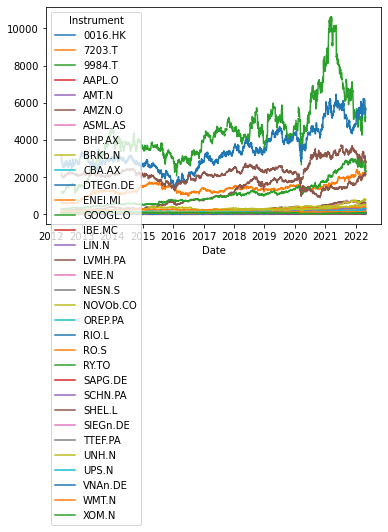

In [132]:
Prices['CLOSE'].plot()
plt.savefig('Data_verification_close')

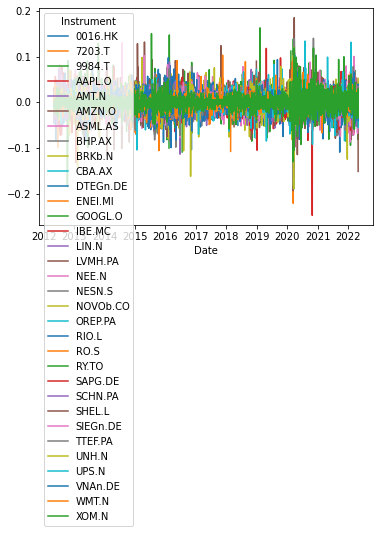

In [133]:
Prices['Return'].plot()
plt.savefig('Data_verification_return')

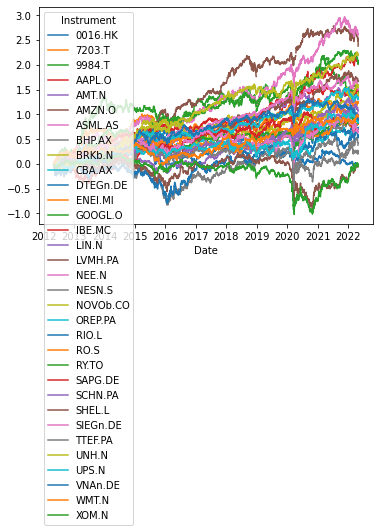

In [134]:
Prices['Return_cont'].plot()
plt.savefig('Data_verification_return_cont')

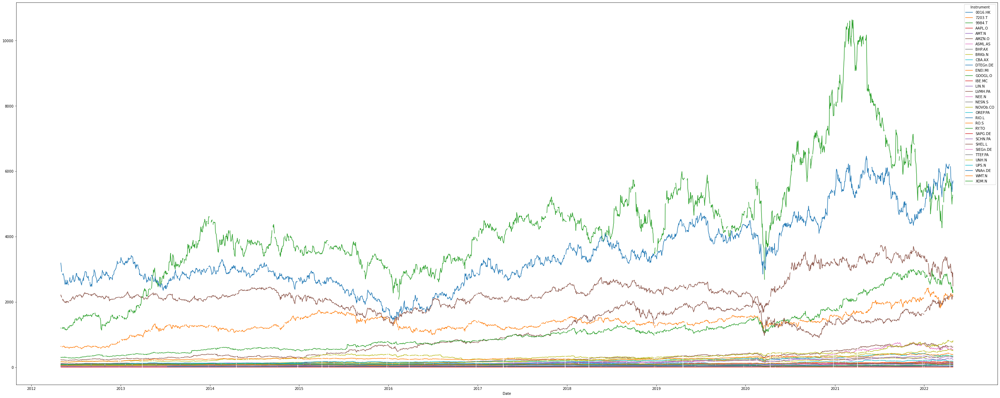

In [135]:
Prices['CLOSE'].plot(figsize = (50, 20))
plt.savefig('Data_verification_close_1')

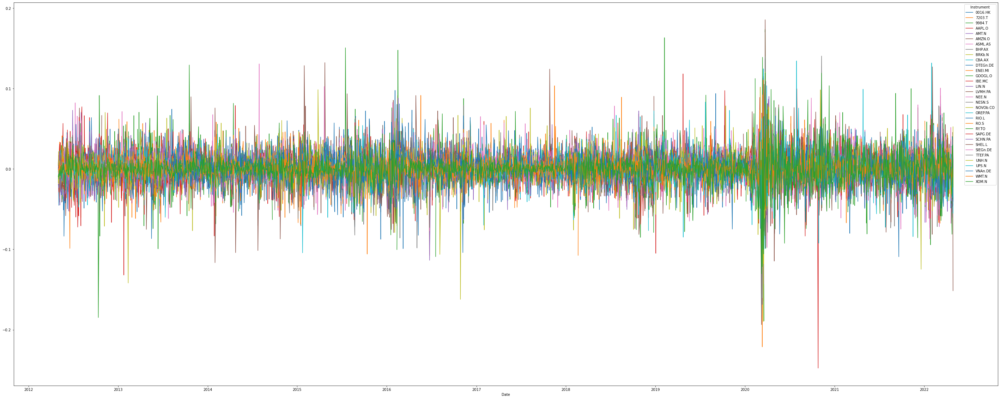

In [136]:
Prices['Return'].plot(figsize = (50, 20))
plt.savefig('Data_verification_return_1')

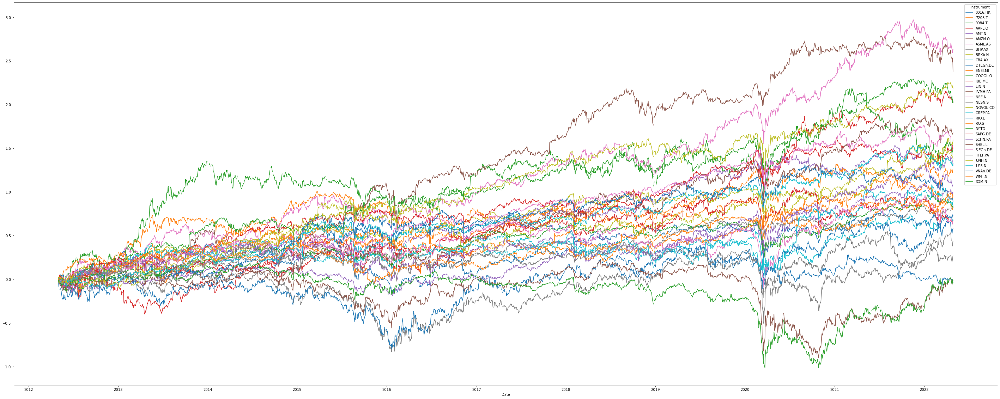

In [137]:
Prices['Return_cont'].plot(figsize = (50, 20))
plt.savefig('Data_verification_return_cont_1')

# Missing Data

In [138]:
# dealing with missing data
Prices=pd.DataFrame(Prices)
Prices.head(10)

CLOSE                                                      \
Instrument 0016.HK 7203.T  9984.T     AAPL.O  AMT.N  AMZN.O    ASML.AS   
Date                                                                     
2012-05-01    <NA>  638.0  1199.0  20.790336  65.43  230.04       <NA>   
2012-05-02    94.3  641.0  1200.5  20.927836  65.92  230.25  39.466114   
2012-05-03    94.3   <NA>    <NA>  20.779265  67.05  229.45  39.445487   
2012-05-04    92.6   <NA>    <NA>   20.18748  66.44  223.99   38.46051   
2012-05-07   90.25  622.0  1185.5  20.338551  67.25  225.16  38.873065   
2012-05-08    89.0  629.0  1197.0  20.292123  67.75   223.9  37.996385   
2012-05-09    89.8  629.0  1223.5  20.327837   67.0  222.98  37.965443   
2012-05-10   89.25  634.0  1207.5  20.375694  67.54  226.69  38.006698   
2012-05-11   88.55  647.0  1184.0  20.239623  67.62  227.68  38.924635   
2012-05-14   87.85  646.0  1219.5  19.936409   67.2  222.93  37.862304   

                                         ... Return_cont                      \
Instrument     BHP.AX BRKb.N     CBA.AX  ...     SAPG.DE   SCHN.PA    SHEL.L   
Date                                     ...                                   
2012-05-01  27.821959  81.46   52.56461  ...        <NA>      <NA>      <NA>   
2012-05-02  28.038532  81.13  52.395528  ...        <NA>      <NA> -0.017087   
2012-05-03  28.038532  81.26  52.395528  ...   -0.006741 -0.000642 -0.013188   
2012-05-04  27.868367  80.94  52.335852  ...   -0.035521 -0.023912 -0.032835   
2012-05-07  26.739091  82.47  51.778876  ...   -0.035833 -0.003749      <NA>   
2012-05-08  26.824174  82.22  51.798768  ...   -0.053872 -0.048635 -0.059806   
2012-05-09  26.553457  81.43  51.381036  ...   -0.037706 -0.049871   -0.0782   
2012-05-10  26.777765  81.78   51.61974  ...   -0.037914 -0.033817 -0.076491   
2012-05-11  26.584396   81.6   51.52028  ...   -0.020158 -0.061059 -0.068477   
2012-05-14  26.654009  80.53   52.51488  ...   -0.021386 -0.091522 -0.093956   

                                                                                
Instrument  SIEGn.DE   TTEF.PA     UNH.N     UPS.N VNAn.DE     WMT.N     XOM.N  
Date                                                                            
2012-05-01      <NA>      <NA>      <NA>      <NA>    <NA>      <NA>      <NA>  
2012-05-02      <NA>      <NA> -0.008261 -0.000637    <NA> -0.001016 -0.009698  
2012-05-03  0.000435  0.000415  -0.02499 -0.005111    <NA> -0.001355 -0.016099  
2012-05-04 -0.018295 -0.017583   -0.0431 -0.009475    <NA> -0.006283 -0.028788  
2012-05-07 -0.020662  -0.00541 -0.033461 -0.008575    <NA>  0.002029 -0.029853  
2012-05-08 -0.036631 -0.034909 -0.023197 -0.010376    <NA> -0.000339 -0.035313  
2012-05-09 -0.030183 -0.047014 -0.034004 -0.016965    <NA> -0.000677 -0.043799  
2012-05-10 -0.018148 -0.027914 -0.032737 -0.023989    <NA>  0.002029 -0.049457  
2012-05-11 -0.009911 -0.028341 -0.034366 -0.026341    <NA>  0.005908 -0.046323  
2012-05-14 -0.027198 -0.047449 -0.035091 -0.029224    <NA>       0.0 -0.058186  

[10 rows x 99 columns]

In [139]:
#Fill in the missing data with the last available observation. In our oppinion this is not accurate, because we assume returns/prices which do not exist. 
Prices.fillna(method = 'bfill')

CLOSE                                                         \
Instrument 0016.HK  7203.T  9984.T     AAPL.O   AMT.N   AMZN.O    ASML.AS   
Date                                                                        
2012-05-01    94.3   638.0  1199.0  20.790336   65.43   230.04  39.466114   
2012-05-02    94.3   641.0  1200.5  20.927836   65.92   230.25  39.466114   
2012-05-03    94.3   622.0  1185.5  20.779265   67.05   229.45  39.445487   
2012-05-04    92.6   622.0  1185.5   20.18748   66.44   223.99   38.46051   
2012-05-07   90.25   622.0  1185.5  20.338551   67.25   225.16  38.873065   
...            ...     ...     ...        ...     ...      ...        ...   
2022-04-25    93.4  2190.0  4989.0     162.88  259.52  2921.48      547.7   
2022-04-26    93.4  2180.0  5195.0      156.8  254.82  2787.82      529.4   
2022-04-27   91.75  2165.5  5182.0     156.57  252.85  2763.34      528.7   
2022-04-28   91.85  2235.5  5269.0     163.64  252.18  2891.93      548.7   
2022-04-29   90.95    <NA>    <NA>     157.65  241.02  2485.63      548.0   

                                          ... Return_cont                      \
Instrument     BHP.AX  BRKb.N     CBA.AX  ...     SAPG.DE   SCHN.PA    SHEL.L   
Date                                      ...                                   
2012-05-01  27.821959   81.46   52.56461  ...   -0.006741 -0.000642 -0.017087   
2012-05-02  28.038532   81.13  52.395528  ...   -0.006741 -0.000642 -0.017087   
2012-05-03  28.038532   81.26  52.395528  ...   -0.006741 -0.000642 -0.013188   
2012-05-04  27.868367   80.94  52.335852  ...   -0.035521 -0.023912 -0.032835   
2012-05-07  26.739091   82.47  51.778876  ...   -0.035833 -0.003749 -0.059806   
...               ...     ...        ...  ...         ...       ...       ...   
2022-04-25  40.655664  336.95     104.75  ...    0.652417  1.089483 -0.064855   
2022-04-26  40.655664  330.65     104.75  ...    0.640015  1.071483 -0.041274   
2022-04-27  40.967304  329.58      103.0  ...    0.643921  1.065017 -0.038218   
2022-04-28  42.757008  331.27     103.23  ...    0.663015  1.081539 -0.012959   
2022-04-29  42.748104  322.83     103.88  ...    0.671248  1.079942 -0.018466   

                                                                        \
Instrument  SIEGn.DE   TTEF.PA     UNH.N     UPS.N   VNAn.DE     WMT.N   
Date                                                                     
2012-05-01  0.000435  0.000415 -0.008261 -0.000637  0.002845 -0.001016   
2012-05-02  0.000435  0.000415 -0.008261 -0.000637  0.002845 -0.001016   
2012-05-03  0.000435  0.000415  -0.02499 -0.005111  0.002845 -0.001355   
2012-05-04 -0.018295 -0.017583   -0.0431 -0.009475  0.002845 -0.006283   
2012-05-07 -0.020662  -0.00541 -0.033461 -0.008575  0.002845  0.002029   
...              ...       ...       ...       ...       ...       ...   
2022-04-25  0.655233  0.197333  2.216677  0.882411  0.921997   0.97714   
2022-04-26   0.62938  0.213665  2.196466  0.847043  0.913065  0.966636   
2022-04-27  0.638891  0.222009  2.196524  0.865179  0.921997  0.959787   
2022-04-28  0.657645  0.257917  2.216964  0.885149  0.927066  0.972478   
2022-04-29  0.670634  0.267385  2.186234  0.830129  0.886833  0.951649   

                      
Instrument     XOM.N  
Date                  
2012-05-01 -0.009698  
2012-05-02 -0.009698  
2012-05-03 -0.016099  
2012-05-04 -0.028788  
2012-05-07 -0.029853  
...              ...  
2022-04-25 -0.056483  
2022-04-26 -0.056118  
2022-04-27 -0.027961  
2022-04-28  0.001837  
2022-04-29  -0.02078  

[2601 rows x 99 columns]

In [140]:
# dealing with missing data
Prices=pd.DataFrame(Prices)
Prices.head(10)

CLOSE                                                      \
Instrument 0016.HK 7203.T  9984.T     AAPL.O  AMT.N  AMZN.O    ASML.AS   
Date                                                                     
2012-05-01    <NA>  638.0  1199.0  20.790336  65.43  230.04       <NA>   
2012-05-02    94.3  641.0  1200.5  20.927836  65.92  230.25  39.466114   
2012-05-03    94.3   <NA>    <NA>  20.779265  67.05  229.45  39.445487   
2012-05-04    92.6   <NA>    <NA>   20.18748  66.44  223.99   38.46051   
2012-05-07   90.25  622.0  1185.5  20.338551  67.25  225.16  38.873065   
2012-05-08    89.0  629.0  1197.0  20.292123  67.75   223.9  37.996385   
2012-05-09    89.8  629.0  1223.5  20.327837   67.0  222.98  37.965443   
2012-05-10   89.25  634.0  1207.5  20.375694  67.54  226.69  38.006698   
2012-05-11   88.55  647.0  1184.0  20.239623  67.62  227.68  38.924635   
2012-05-14   87.85  646.0  1219.5  19.936409   67.2  222.93  37.862304   

                                         ... Return_cont                      \
Instrument     BHP.AX BRKb.N     CBA.AX  ...     SAPG.DE   SCHN.PA    SHEL.L   
Date                                     ...                                   
2012-05-01  27.821959  81.46   52.56461  ...        <NA>      <NA>      <NA>   
2012-05-02  28.038532  81.13  52.395528  ...        <NA>      <NA> -0.017087   
2012-05-03  28.038532  81.26  52.395528  ...   -0.006741 -0.000642 -0.013188   
2012-05-04  27.868367  80.94  52.335852  ...   -0.035521 -0.023912 -0.032835   
2012-05-07  26.739091  82.47  51.778876  ...   -0.035833 -0.003749      <NA>   
2012-05-08  26.824174  82.22  51.798768  ...   -0.053872 -0.048635 -0.059806   
2012-05-09  26.553457  81.43  51.381036  ...   -0.037706 -0.049871   -0.0782   
2012-05-10  26.777765  81.78   51.61974  ...   -0.037914 -0.033817 -0.076491   
2012-05-11  26.584396   81.6   51.52028  ...   -0.020158 -0.061059 -0.068477   
2012-05-14  26.654009  80.53   52.51488  ...   -0.021386 -0.091522 -0.093956   

                                                                                
Instrument  SIEGn.DE   TTEF.PA     UNH.N     UPS.N VNAn.DE     WMT.N     XOM.N  
Date                                                                            
2012-05-01      <NA>      <NA>      <NA>      <NA>    <NA>      <NA>      <NA>  
2012-05-02      <NA>      <NA> -0.008261 -0.000637    <NA> -0.001016 -0.009698  
2012-05-03  0.000435  0.000415  -0.02499 -0.005111    <NA> -0.001355 -0.016099  
2012-05-04 -0.018295 -0.017583   -0.0431 -0.009475    <NA> -0.006283 -0.028788  
2012-05-07 -0.020662  -0.00541 -0.033461 -0.008575    <NA>  0.002029 -0.029853  
2012-05-08 -0.036631 -0.034909 -0.023197 -0.010376    <NA> -0.000339 -0.035313  
2012-05-09 -0.030183 -0.047014 -0.034004 -0.016965    <NA> -0.000677 -0.043799  
2012-05-10 -0.018148 -0.027914 -0.032737 -0.023989    <NA>  0.002029 -0.049457  
2012-05-11 -0.009911 -0.028341 -0.034366 -0.026341    <NA>  0.005908 -0.046323  
2012-05-14 -0.027198 -0.047449 -0.035091 -0.029224    <NA>       0.0 -0.058186  

[10 rows x 99 columns]

# Drop missing values

We decided to drop alle dates which contains missing values in any of the selected stocks. So we can work with real data.

In [141]:
Prices2= Prices.dropna(axis = 0, how = 'any')
Prices2.head()


CLOSE                                                    \
Instrument 0016.HK  7203.T  9984.T     AAPL.O  AMT.N  AMZN.O ASML.AS   
Date                                                                   
2013-07-12   102.3  1282.0  2880.0  15.232485  77.84  307.55    67.1   
2013-07-16   102.3  1292.0  2955.0  15.364092  74.71  306.87   66.48   
2013-07-17   102.4  1300.0  3100.0  15.368199  73.87  308.69   67.82   
2013-07-18   102.3  1296.0  3225.0  15.419913  74.44  304.11   67.79   
2013-07-19   102.1  1294.0  3215.0  15.176771  75.13  305.23   67.68   

                                          ... Return_cont                      \
Instrument     BHP.AX  BRKb.N     CBA.AX  ...     SAPG.DE   SCHN.PA    SHEL.L   
Date                                      ...                                   
2013-07-12   25.76451  117.12  70.586762  ...    0.140128  0.174845 -0.002035   
2013-07-16  25.857328   117.2   71.36255  ...    0.142914  0.162198  0.001354   
2013-07-17   26.44517  117.63  70.825466  ...    0.145518   0.18822  0.002256   
2013-07-18  26.468374  118.56  71.352604  ...    0.134358  0.194225  0.007651   
2013-07-19  26.189923   118.9  71.074116  ...      0.1113  0.210815  0.007651   

                                                                        \
Instrument  SIEGn.DE   TTEF.PA     UNH.N     UPS.N   VNAn.DE     WMT.N   
Date                                                                     
2013-07-12  0.174462  0.065714  0.174178  0.093025  0.002845  0.273231   
2013-07-16  0.180228  0.072169  0.158019  0.091398  0.025318  0.269876   
2013-07-17  0.192772  0.077176  0.147804  0.099161  0.033617  0.267676   
2013-07-18  0.210874  0.098086  0.210992  0.112914  0.030858  0.269488   
2013-07-19  0.222204  0.095574  0.223669  0.115529  0.036368  0.279011   

                      
Instrument     XOM.N  
Date                  
2013-07-12  0.070524  
2013-07-16  0.069452  
2013-07-17  0.071166  
2013-07-18  0.080961  
2013-07-19  0.089297  

[5 rows x 99 columns]

In [142]:
Prices2.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1865 entries, 2013-07-12 to 2022-04-28
Data columns (total 99 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   (CLOSE, 0016.HK)         1865 non-null   Float64
 1   (CLOSE, 7203.T)          1865 non-null   Float64
 2   (CLOSE, 9984.T)          1865 non-null   Float64
 3   (CLOSE, AAPL.O)          1865 non-null   Float64
 4   (CLOSE, AMT.N)           1865 non-null   Float64
 5   (CLOSE, AMZN.O)          1865 non-null   Float64
 6   (CLOSE, ASML.AS)         1865 non-null   Float64
 7   (CLOSE, BHP.AX)          1865 non-null   Float64
 8   (CLOSE, BRKb.N)          1865 non-null   Float64
 9   (CLOSE, CBA.AX)          1865 non-null   Float64
 10  (CLOSE, DTEGn.DE)        1865 non-null   Float64
 11  (CLOSE, ENEI.MI)         1865 non-null   Float64
 12  (CLOSE, GOOGL.O)         1865 non-null   Float64
 13  (CLOSE, IBE.MC)          1865 non-null   Float64
 14  (CLOSE, LIN.N)

In [143]:
Prices2.describe()

CLOSE                                                       \
Instrument      0016.HK       7203.T        9984.T       AAPL.O        AMT.N   
count       1865.000000  1865.000000   1865.000000  1865.000000  1865.000000   
mean         110.911850  1441.943646   4679.263271    58.771006   157.749314   
std           12.577119   261.797790   1562.193421    44.612318    66.632138   
min           80.350000   995.000000   2082.000000    14.963914    68.360000   
25%          100.400000  1254.000000   3642.500000    27.497500    97.890000   
50%          111.600000  1382.200000   4295.000000    40.520000   139.070000   
75%          119.600000  1537.600000   5201.000000    71.000000   224.270000   
max          141.600000  2423.500000  10635.000000   179.700000   303.620000   

                                                                             \
Instrument       AMZN.O      ASML.AS       BHP.AX       BRKb.N       CBA.AX   
count       1865.000000  1865.000000  1865.000000  1865.000000  1865.000000   
mean        1489.926771   211.802944    28.234641   186.508997    80.133921   
std         1076.829937   180.315567     7.691104    54.470155     9.651393   
min          280.930000    58.000000    12.122925   108.780000    54.260000   
25%          531.900000    87.540000    22.615231   142.110000    73.610000   
50%         1159.790000   145.100000    27.908339   182.520000    78.712644   
75%         1990.000000   263.100000    33.149592   212.940000    83.620000   
max         3731.410000   770.500000    48.135024   359.570000   110.130000   

            ...  Return_cont                                         \
Instrument  ...      SAPG.DE      SCHN.PA       SHEL.L     SIEGn.DE   
count       ...  1865.000000  1865.000000  1865.000000  1865.000000   
mean        ...     0.547204     0.499067    -0.132284     0.481771   
std         ...     0.275831     0.309857     0.227014     0.185251   
min         ...     0.020644    -0.018017    -0.899935    -0.093019   
25%         ...     0.301574     0.289071    -0.280196     0.349634   
50%         ...     0.603616     0.394464    -0.060286     0.444388   
75%         ...     0.763984     0.638093     0.036158     0.579550   
max         ...     1.048437     1.335637     0.209727     0.964157   

                                                                             \
Instrument      TTEF.PA        UNH.N        UPS.N      VNAn.DE        WMT.N   
count       1865.000000  1865.000000  1865.000000  1865.000000  1865.000000   
mean           0.194664     1.190784     0.412133     0.764317     0.458636   
std            0.135627     0.561524     0.244162     0.350182     0.274609   
min           -0.505858     0.147804     0.086735     0.002845    -0.045899   
25%            0.143562     0.729752     0.253987     0.551948     0.234489   
50%            0.219013     1.314553     0.326795     0.818811     0.382808   
75%            0.281368     1.599976     0.421186     1.042008     0.701996   
max            0.441378     2.257308     1.054273     1.315329     0.995638   

                         
Instrument        XOM.N  
count       1865.000000  
mean          -0.157142  
std            0.252053  
min           -1.017969  
25%           -0.231827  
50%           -0.072042  
75%            0.000115  
max            0.181670  

[8 rows x 99 columns]

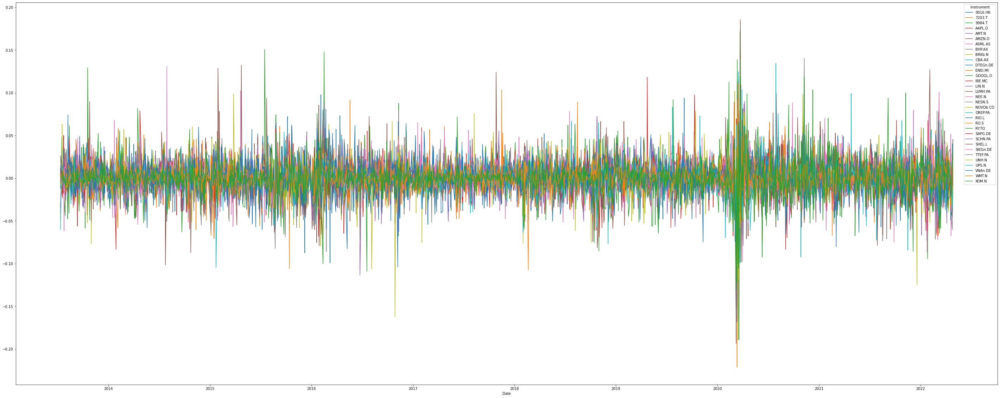

In [144]:
Prices2['Return'].plot(figsize = (50, 20))
plt.savefig('Return')


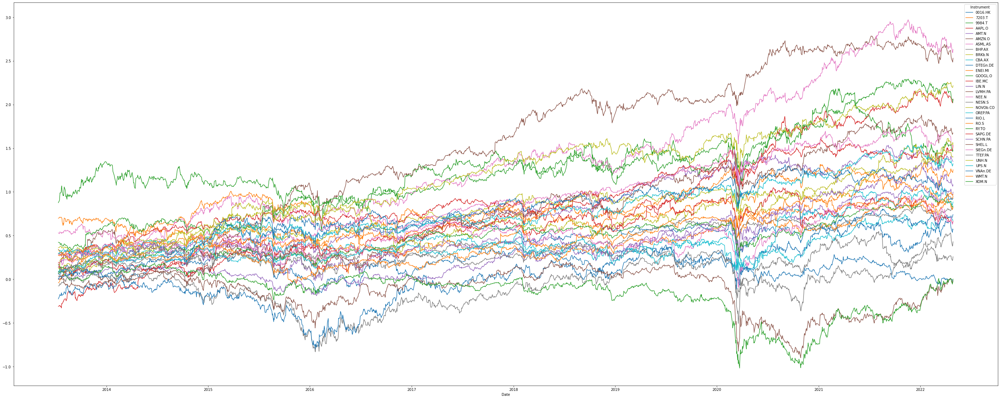

In [145]:
Prices2['Return_cont'].plot(figsize = (50, 20))
plt.savefig('Return_cont')

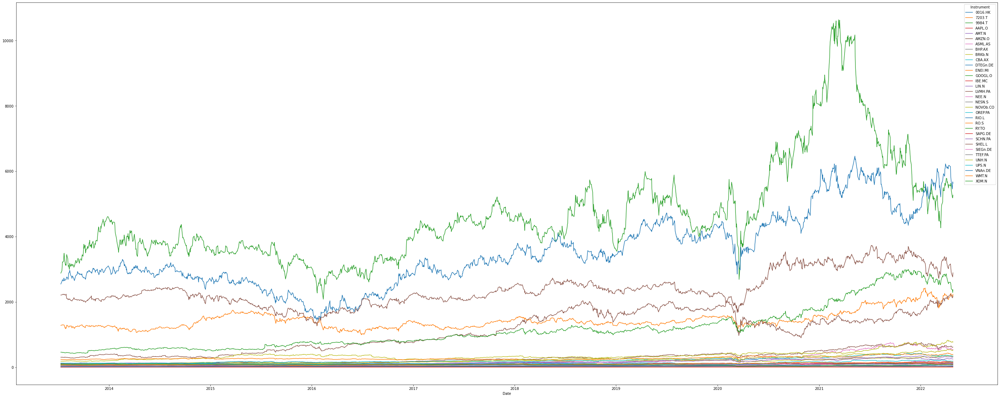

In [146]:
Prices2['CLOSE'].plot(figsize = (50, 20))
plt.savefig('Close')

# Put the data into a data base

We creat a new data base with the Name "Stock analysis data base". We connect this file with the empty data base.

In [147]:
import sqlite3
from sqlite3 import Error


def create_connection(db_file):
    """ create a database connection to a SQLite database """
    conn = None
    try:
        conn = sqlite3.connect(db_file)
        print(sqlite3.version)
    except Error as e:
        print(e)
    finally:
        if conn:
            conn.close()


if __name__ == '__main__':
    create_connection(r"Z:\06_ZHAW\03_2. Semester\03_Advanced Quantitative Methods\00_AQM\Stock_analysis_data_base.db")

2.6.0


In [148]:
conn = sqlite3.connect(r"Z:\06_ZHAW\03_2. Semester\03_Advanced Quantitative Methods\00_AQM\Stock_analysis_data_base.db")

print("Opened database successfully")

Opened database successfully


In [149]:
#Connect the file with the SQL data base and fill in the clean data, Date = Index
Prices2.to_sql('StockPrices', con = sqlite3.connect(r"Z:\06_ZHAW\03_2. Semester\03_Advanced Quantitative Methods\00_AQM\Stock_analysis_data_base.db"),
 schema=None, if_exists='replace', index=True, index_label='Date', chunksize=None, dtype=None, method=None)

c:\Users\marco.berweger\Anaconda3\lib\site-packages\pandas\core\generic.py:2779: UserWarning: The spaces in these column names will not be changed. In pandas versions < 0.14, spaces were converted to underscores.
  sql.to_sql(


# Reading data from the data base

In [150]:
#Let's now select the data from the database and pull them to python 
c = conn.cursor()
c.execute("SELECT * FROM StockPrices")
Prices_DB=c.fetchall()
Prices_DB

[('2013-07-12',
  102.3,
  1282.0,
  2880.0,
  15.2324847675,
  77.84,
  307.55,
  67.1,
  25.764510484247474,
  117.12,
  70.58676200000001,
  9.0,
  2.304,
  461.94765499999994,
  2.9077143956842413,
  117.09,
  120.08849775,
  21.0025,
  63.75,
  187.10000000000002,
  129.65,
  2547.412742592141,
  244.0,
  61.8,
  57.04658496,
  55.7,
  2209.0,
  71.711143,
  38.6,
  68.0,
  86.12,
  15.699010932404803,
  77.63,
  93.4,
  0.0058823699030670085,
  0.004691173575880114,
  0.006968669316093745,
  -0.0018224456260886868,
  0.007867455296576509,
  0.02598917703937964,
  0.008982096315827803,
  0.014210367621361186,
  0.0011960701981212907,
  -0.006180663024126787,
  0.00545931944741751,
  -0.048294009358956336,
  0.0029947289150973333,
  -0.034030708924811304,
  -0.002558855029797691,
  -0.0029973795389741653,
  0.009327979618751758,
  -0.0031323439863157887,
  0.0005346164254573793,
  0.0015438057871266508,
  -0.012250486094220747,
  0.006166514915664223,
  0.0029168712951239684,
  0.0

In [151]:
#convert the lists into dataframe
Prices_DB=pd.DataFrame(Prices_DB,columns=['Date', '0016.HK_CLOSE','7203.T_CLOSE','9984.T_CLOSE','AAPL.O_CLOSE','AMT.N_CLOSE','AMZN.O_CLOSE','ASML.AS_CLOSE','BHP.AX_CLOSE','BRKb.N_CLOSE','CBA.AX_CLOSE','DTEGn.DE_CLOSE','ENEI.MI_CLOSE','GOOGL.O_CLOSE','IBE.MC_CLOSE','LIN.N_CLOSE','LVMH.PA_CLOSE','NEE.N_CLOSE','NESN.S_CLOSE','NOVOb.CO_CLOSE','OREP.PA_CLOSE','RIO.L_CLOSE','RO.S_CLOSE','RY.TO_CLOSE','SAPG.DE_CLOSE','SCHN.PA_CLOSE','SHEL.L_CLOSE','SIEGn.DE_CLOSE','TTEF.PA_CLOSE','UNH.N_CLOSE','UPS.N_CLOSE','VNAn.DE_CLOSE','WMT.N_CLOSE','XOM.N_CLOSE','0016.HK_Return','7203.T_Return','9984.T_Return','AAPL.O_Return','AMT.N_Return','AMZN.O_Return','ASML.AS_Return','BHP.AX_Return','BRKb.N_Return','CBA.AX_Return','DTEGn.DE_Return','ENEI.MI_Return','GOOGL.O_Return','IBE.MC_Return','LIN.N_Return','LVMH.PA_Return','NEE.N_Return','NESN.S_Return','NOVOb.CO_Return','OREP.PA_Return','RIO.L_Return','RO.S_Return','RY.TO_Return','SAPG.DE_Return','SCHN.PA_Return','SHEL.L_Return','SIEGn.DE_Return','TTEF.PA_Return','UNH.N_Return','UPS.N_Return','VNAn.DE_Return','WMT.N_Return','XOM.N_Return','0016.HK_Return_cont','7203.T_Return_cont','9984.T_Return_cont','AAPL.O_Return_cont','AMT.N_Return_cont','AMZN.O_Return_cont','ASML.AS_Return_cont','BHP.AX_Return_cont','BRKb.N_Return_cont','CBA.AX_Return_cont','DTEGn.DE_Return_cont','ENEI.MI_Return_cont','GOOGL.O_Return_cont','IBE.MC_Return_cont','LIN.N_Return_cont','LVMH.PA_Return_cont','NEE.N_Return_cont','NESN.S_Return_cont','NOVOb.CO_Return_cont','OREP.PA_Return_cont','RIO.L_Return_cont','RO.S_Return_cont','RY.TO_Return_cont','SAPG.DE_Return_cont','SCHN.PA_Return_cont','SHEL.L_Return_cont','SIEGn.DE_Return_cont','TTEF.PA_Return_cont','UNH.N_Return_cont','UPS.N_Return_cont','VNAn.DE_Return_cont','WMT.N_Return_cont','XOM.N_Return_cont'])
Prices_DB.head()

,Date,0016.HK_CLOSE,7203.T_CLOSE,9984.T_CLOSE,AAPL.O_CLOSE,AMT.N_CLOSE,AMZN.O_CLOSE,ASML.AS_CLOSE,BHP.AX_CLOSE,BRKb.N_CLOSE,...,SAPG.DE_Return_cont,SCHN.PA_Return_cont,SHEL.L_Return_cont,SIEGn.DE_Return_cont,TTEF.PA_Return_cont,UNH.N_Return_cont,UPS.N_Return_cont,VNAn.DE_Return_cont,WMT.N_Return_cont,XOM.N_Return_cont
0,2013-07-12,102.3,1282.0,2880.0,15.232485,77.84,307.55,67.10,25.764510,117.12,...,0.140128,0.174845,-0.002035,0.174462,0.065714,0.174178,0.093025,0.002845,0.273231,0.070524
1,2013-07-16,102.3,1292.0,2955.0,15.364092,74.71,306.87,66.48,25.857328,117.20,...,0.142914,0.162198,0.001354,0.180228,0.072169,0.158019,0.091398,0.025318,0.269876,0.069452
2,2013-07-17,102.4,1300.0,3100.0,15.368199,73.87,308.69,67.82,26.445170,117.63,...,0.145518,0.188220,0.002256,0.192772,0.077176,0.147804,0.099161,0.033617,0.267676,0.071166
3,2013-07-18,102.3,1296.0,3225.0,15.419913,74.44,304.11,67.79,26.468374,118.56,...,0.134358,0.194225,0.007651,0.210874,0.098086,0.210992,0.112914,0.030858,0.269488,0.080961
4,2013-07-19,102.1,1294.0,3215.0,15.176771,75.13,305.23,67.68,26.189923,118.90,...,0.111300,0.210815,0.007651,0.222204,0.095574,0.223669,0.115529,0.036368,0.279011,0.089297


In [152]:
Prices_DB.head(10)

,Date,0016.HK_CLOSE,7203.T_CLOSE,9984.T_CLOSE,AAPL.O_CLOSE,AMT.N_CLOSE,AMZN.O_CLOSE,ASML.AS_CLOSE,BHP.AX_CLOSE,BRKb.N_CLOSE,...,SAPG.DE_Return_cont,SCHN.PA_Return_cont,SHEL.L_Return_cont,SIEGn.DE_Return_cont,TTEF.PA_Return_cont,UNH.N_Return_cont,UPS.N_Return_cont,VNAn.DE_Return_cont,WMT.N_Return_cont,XOM.N_Return_cont
0,2013-07-12,102.3,1282.0,2880.0,15.232485,77.84,307.55,67.10,25.764510,117.12,...,0.140128,0.174845,-0.002035,0.174462,0.065714,0.174178,0.093025,0.002845,0.273231,0.070524
1,2013-07-16,102.3,1292.0,2955.0,15.364092,74.71,306.87,66.48,25.857328,117.20,...,0.142914,0.162198,0.001354,0.180228,0.072169,0.158019,0.091398,0.025318,0.269876,0.069452
2,2013-07-17,102.4,1300.0,3100.0,15.368199,73.87,308.69,67.82,26.445170,117.63,...,0.145518,0.188220,0.002256,0.192772,0.077176,0.147804,0.099161,0.033617,0.267676,0.071166
3,2013-07-18,102.3,1296.0,3225.0,15.419913,74.44,304.11,67.79,26.468374,118.56,...,0.134358,0.194225,0.007651,0.210874,0.098086,0.210992,0.112914,0.030858,0.269488,0.080961
4,2013-07-19,102.1,1294.0,3215.0,15.176771,75.13,305.23,67.68,26.189923,118.90,...,0.111300,0.210815,0.007651,0.222204,0.095574,0.223669,0.115529,0.036368,0.279011,0.089297
5,2013-07-22,102.1,1298.0,3245.0,15.225342,74.32,303.48,67.20,26.391027,118.94,...,0.102649,0.196512,0.008099,0.225315,0.105831,0.233834,0.110179,0.036368,0.276318,0.085718
6,2013-07-23,103.5,1296.0,3410.0,14.963914,74.75,301.06,66.64,26.684948,118.21,...,0.100294,0.192286,0.002256,0.222204,0.098086,0.240874,0.109037,0.036368,0.285012,0.089612
7,2013-07-24,104.3,1286.0,3490.0,15.732484,73.94,298.94,67.36,26.862847,116.46,...,0.110761,0.215136,0.010114,0.224359,0.106328,0.238671,0.102962,0.030858,0.280930,0.087404
8,2013-07-25,103.1,1276.0,3350.0,15.660699,72.31,303.40,67.61,26.893787,117.07,...,0.107884,0.213755,0.007427,0.162702,0.101466,0.239911,0.101236,0.025318,0.278114,0.087193
9,2013-07-26,103.4,1230.0,3260.0,15.749627,72.58,312.01,67.15,26.762295,117.34,...,0.102649,0.221153,0.002707,0.176095,0.102965,0.234249,0.103077,0.022536,0.277986,0.085296


In [153]:
Prices_DB = Prices_DB.set_index('Date', pd.to_datetime)
Prices_DB.head(10)

,0016.HK_CLOSE,7203.T_CLOSE,9984.T_CLOSE,AAPL.O_CLOSE,AMT.N_CLOSE,AMZN.O_CLOSE,ASML.AS_CLOSE,BHP.AX_CLOSE,BRKb.N_CLOSE,CBA.AX_CLOSE,...,SAPG.DE_Return_cont,SCHN.PA_Return_cont,SHEL.L_Return_cont,SIEGn.DE_Return_cont,TTEF.PA_Return_cont,UNH.N_Return_cont,UPS.N_Return_cont,VNAn.DE_Return_cont,WMT.N_Return_cont,XOM.N_Return_cont
Date,,,,,,,,,,,,,,,,,,,,,
2013-07-12,102.3,1282.0,2880.0,15.232485,77.84,307.55,67.10,25.764510,117.12,70.586762,...,0.140128,0.174845,-0.002035,0.174462,0.065714,0.174178,0.093025,0.002845,0.273231,0.070524
2013-07-16,102.3,1292.0,2955.0,15.364092,74.71,306.87,66.48,25.857328,117.20,71.362550,...,0.142914,0.162198,0.001354,0.180228,0.072169,0.158019,0.091398,0.025318,0.269876,0.069452
2013-07-17,102.4,1300.0,3100.0,15.368199,73.87,308.69,67.82,26.445170,117.63,70.825466,...,0.145518,0.188220,0.002256,0.192772,0.077176,0.147804,0.099161,0.033617,0.267676,0.071166
2013-07-18,102.3,1296.0,3225.0,15.419913,74.44,304.11,67.79,26.468374,118.56,71.352604,...,0.134358,0.194225,0.007651,0.210874,0.098086,0.210992,0.112914,0.030858,0.269488,0.080961
2013-07-19,102.1,1294.0,3215.0,15.176771,75.13,305.23,67.68,26.189923,118.90,71.074116,...,0.111300,0.210815,0.007651,0.222204,0.095574,0.223669,0.115529,0.036368,0.279011,0.089297
2013-07-22,102.1,1298.0,3245.0,15.225342,74.32,303.48,67.20,26.391027,118.94,71.491848,...,0.102649,0.196512,0.008099,0.225315,0.105831,0.233834,0.110179,0.036368,0.276318,0.085718
2013-07-23,103.5,1296.0,3410.0,14.963914,74.75,301.06,66.64,26.684948,118.21,71.999094,...,0.100294,0.192286,0.002256,0.222204,0.098086,0.240874,0.109037,0.036368,0.285012,0.089612
2013-07-24,104.3,1286.0,3490.0,15.732484,73.94,298.94,67.36,26.862847,116.46,72.506340,...,0.110761,0.215136,0.010114,0.224359,0.106328,0.238671,0.102962,0.030858,0.280930,0.087404
2013-07-25,103.1,1276.0,3350.0,15.660699,72.31,303.40,67.61,26.893787,117.07,73.122992,...,0.107884,0.213755,0.007427,0.162702,0.101466,0.239911,0.101236,0.025318,0.278114,0.087193


In [154]:
Prices_DB['AAPL.O_Return'].describe()

count    1865.000000
mean        0.000830
std         0.017725
min        -0.137708
25%        -0.007335
50%         0.000613
75%         0.009693
max         0.113157
Name: AAPL.O_Return, dtype: float64

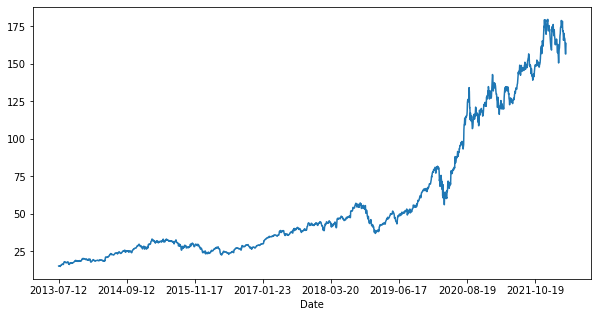

In [155]:
Prices_DB['AAPL.O_CLOSE'].plot(figsize = (10, 5))
plt.savefig('Close_AAPL')

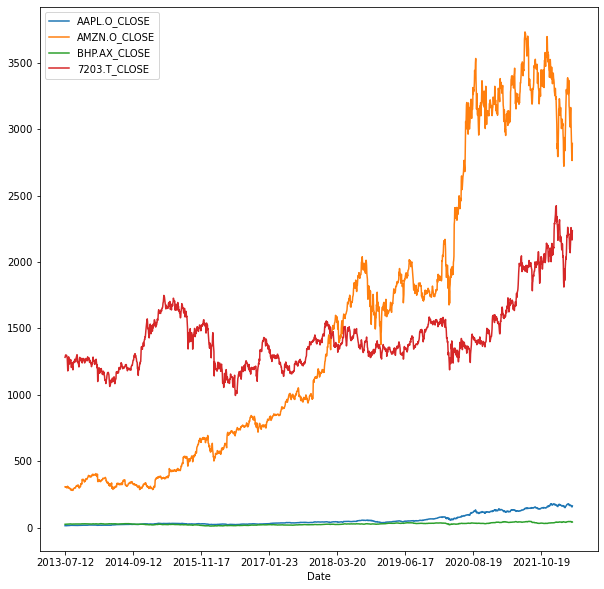

In [156]:
Prices_DB.plot(y=["AAPL.O_CLOSE", "AMZN.O_CLOSE", "BHP.AX_CLOSE", "7203.T_CLOSE"],
        kind="line", figsize=(10, 10))
plt.savefig('Close_AAPL_AMZN_BHP_7203')

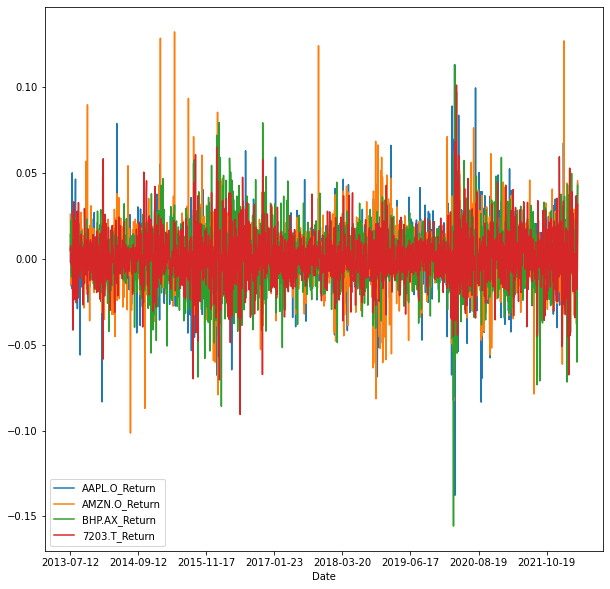

In [157]:
Prices_DB.plot(y=["AAPL.O_Return", "AMZN.O_Return", "BHP.AX_Return", "7203.T_Return"],
        kind="line", figsize=(10, 10))
plt.savefig('Return_AAPL_AMZN_BHP_7203')

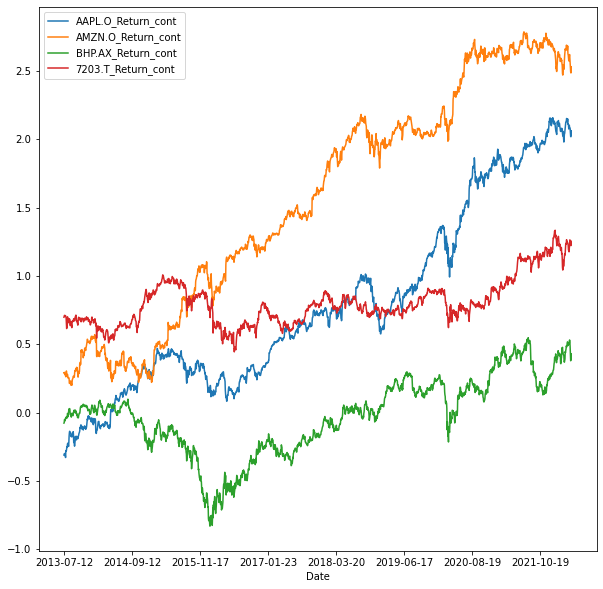

In [158]:
Prices_DB.plot(y=["AAPL.O_Return_cont", "AMZN.O_Return_cont", "BHP.AX_Return_cont", "7203.T_Return_cont"],
        kind="line", figsize=(10, 10))
plt.savefig('Return_cont_AAPL_AMZN_BHP_7203')

# Normality test for the sample "Apple [AAPL.O_Return]"

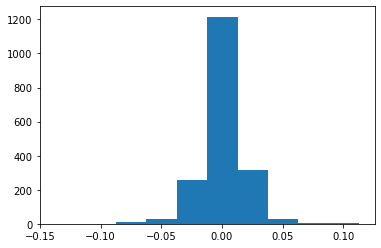

<Figure size 432x288 with 0 Axes>

In [185]:
plt.hist(Prices_DB['AAPL.O_Return'])
plt.show()
plt.savefig('Normality_test_hist_AAPL')

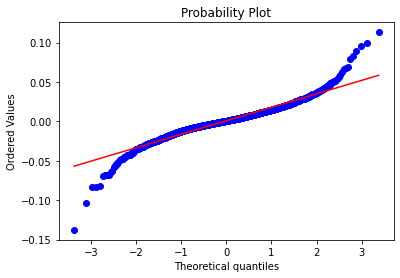

<Figure size 432x288 with 0 Axes>

In [186]:
stats.probplot(Prices_DB['AAPL.O_Return'], dist="norm", plot=pylab)
pylab.show()
plt.savefig('Normality_test_probplot_AAPL')

In [187]:
result = (jarque_bera(Prices_DB['AAPL.O_Return']))

print(f"JB statistic: {result[0]}")
print(f"p-value: {result[1]}")

JB statistic: 3387.7083273249805
p-value: 0.0


In [188]:
data_norm = np.random.normal(np.mean(Prices_DB['AAPL.O_Return']), np.std(Prices_DB['AAPL.O_Return']), len(Prices_DB))

In [189]:
values, base = np.histogram(Prices_DB['AAPL.O_Return'])
values_norm, base_norm = np.histogram(data_norm)

In [190]:
cumulative = np.cumsum(values)
cumulative_norm = np.cumsum(values_norm)

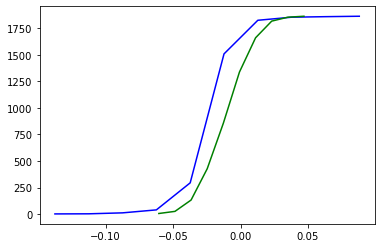

<Figure size 432x288 with 0 Axes>

In [191]:
plt.plot(base[:-1], cumulative, c='blue')
plt.plot(base_norm[:-1], cumulative_norm, c='green')
plt.show()
plt.savefig('cumulative distribution functions apple')

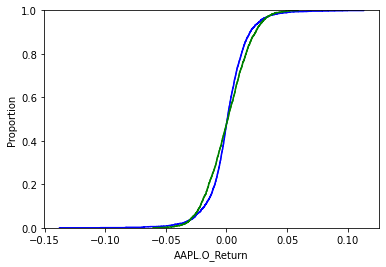

In [193]:
sns.ecdfplot(Prices_DB['AAPL.O_Return'], c='blue')
sns.ecdfplot(data_norm, c='green')
plt.savefig('cumulative distribution functions apple_new')

In [195]:
from scipy.stats import kstest

result = (kstest(Prices_DB['AAPL.O_Return'], cdf='norm'))

print(f"K-S statistic: {result[0]}")
print(f"p-value: {result[1]}")

K-S statistic: 0.4721140436368988
p-value: 0.0


In [196]:
from scipy.stats import anderson

result = (anderson(Prices_DB['AAPL.O_Return'], dist='norm'))

print(f"A-D statistic: {result[0]}")
print(f"Critical values: {result[1]}")
print(f"Significance levels: {result[2]}")

A-D statistic: 24.28727201997026
Critical values: [0.575 0.655 0.785 0.916 1.09 ]
Significance levels: [15.  10.   5.   2.5  1. ]


In [197]:
from scipy.stats import shapiro

result = (shapiro(Prices_DB['AAPL.O_Return']))

print(f"S-W statistic: {result[0]}")
print(f"p-value: {result[1]}")

S-W statistic: 0.9290825128555298
p-value: 7.507691405571919e-29


# Test for stationarity in level and first difference, up to 2 lags

There are several methods for testing for the presence of a unit root in a non stationary process

1. (Advanced) Dickey Fuller is based on a common AR(p) model and is popular because of its simplicity and
generality.

2. A non parametric Phillips Perron test transforms t statistic to further account for autocorrelation and
heteroscedasticity effects.

We start with the Dickey Fuller, because it is a good starting basis. 

# Def OLS

In [159]:
def OLS(y,x):

    #if const is not None: x['const']=1
        
    #Beta estimates [(X'X)^-1]X'Y
    x_xt= np.dot(x.T,x)         # multiply vector X with transposed vector X'
    x_x_inv=np.linalg.inv(x_xt)      # invert the matrix

    x_y= np.dot(x.T,y)                 # multiply transposed vector X' with Y
    est_betas= np.dot(x_x_inv,x_y)  # multiply (X'X)^-1 with X'Y
    est_Y=      np.dot(est_betas,x.T)  # multiply est_betas with X'
        
    nb_obs=x.shape[0]  
    rank=x.shape[1] #equals p = number of regressors 
    deg_freedom_residual=nb_obs-rank
    
    #Y estimate
    est_y = np.dot(x,est_betas)
    est_resid = y-est_y
    
    est_resid_2 = np.dot(est_resid.T,est_resid)
    
    est_sigma_2= est_resid_2 / nb_obs
    
    est_var_covar_beta = np.dot(x_x_inv,est_sigma_2)  #Variance-Covariance Matrix of Betas
        #var_beta_est = np.kron(x_x_inv,est_sigma_2) #???
    
    est_var_beta = np.diag(est_var_covar_beta)
    est_sd_beta=np.sqrt(est_var_beta)    # standard errors of beta
    t_stats= est_betas/est_sd_beta       # t-stats
    pvals = stats.t.sf(np.abs(t_stats), nb_obs-1)*2
  
    SST=np.var(y)*nb_obs
    SSR=est_resid_2
    R_2= 1-(SSR/SST)
    
    llf = (-0.5*nb_obs * np.log(2 * np.pi*est_sigma_2)) -(0.5*nb_obs*(1/np.log(est_sigma_2))*est_resid_2)
    
    OLS_results = {
        'Y': y,
        'est_Y': est_Y,
        'X': x,
        'est_betas': est_betas,
        'est_resid': est_resid,
        'nb_obs': nb_obs,
        'deg_freedom_residual': deg_freedom_residual,
        'est_sigma_2': est_sigma_2,
        'est_var_covar_beta': est_var_covar_beta,
        't_stats': t_stats,
        'pvals': pvals,
        'llf': llf,
        'nb_parms': rank,
        'R_2': R_2
    }
                                                          
    return OLS_results

In [160]:
?adfuller

Signature:
adfuller(
    x,
    maxlag=None,
    regression='c',
    autolag='AIC',
    store=False,
    regresults=False,
)
Docstring:
Augmented Dickey-Fuller unit root test.

The Augmented Dickey-Fuller test can be used to test for a unit root in a
univariate process in the presence of serial correlation.

Parameters
----------
x : array_like, 1d
    The data series to test.
maxlag : int
    Maximum lag which is included in test, default 12*(nobs/100)^{1/4}.
regression : {"c","ct","ctt","nc"}
    Constant and trend order to include in regression.

    * "c" : constant only (default).
    * "ct" : constant and trend.
    * "ctt" : constant, and linear and quadratic trend.
    * "nc" : no constant, no trend.

autolag : {"AIC", "BIC", "t-stat", None}
    Method to use when automatically determining the lag length among the
    values 0, 1, ..., maxlag.

    * If "AIC" (default) or "BIC", then the number of lags is chosen
      to minimize the corresponding information criterion.
    * "

In [161]:
var_list=['0016.HK_CLOSE','7203.T_CLOSE','9984.T_CLOSE','AAPL.O_CLOSE','AMT.N_CLOSE','AMZN.O_CLOSE','ASML.AS_CLOSE','BHP.AX_CLOSE','BRKb.N_CLOSE','CBA.AX_CLOSE','DTEGn.DE_CLOSE','ENEI.MI_CLOSE','GOOGL.O_CLOSE','IBE.MC_CLOSE','LIN.N_CLOSE','LVMH.PA_CLOSE','NEE.N_CLOSE','NESN.S_CLOSE','NOVOb.CO_CLOSE','OREP.PA_CLOSE','RIO.L_CLOSE','RO.S_CLOSE','RY.TO_CLOSE','SAPG.DE_CLOSE','SCHN.PA_CLOSE','SHEL.L_CLOSE','SIEGn.DE_CLOSE','TTEF.PA_CLOSE','UNH.N_CLOSE','UPS.N_CLOSE','VNAn.DE_CLOSE','WMT.N_CLOSE','XOM.N_CLOSE']


for i in var_list:
    for lags in range(1,3):
        print('Number of lags used:',lags)

        adf_library = adfuller(Prices_DB[i], maxlag=lags, regression='nc',autolag=None)
        adf_library_d = adfuller(np.diff(Prices_DB[i]), maxlag=lags, regression='nc',autolag=None)

        print(i,'in Level','\n',
              'ADF Stat (Library) for',i,':',"%.2f" % adf_library[0],'\n',
              'ADF P-Val (Library)',i,':',"%.2f" %  adf_library[1],'\n')

        print(i,'in 1st Difference','\n',
              'ADF Stat (Library) for',i,':',"%.2f" % adf_library_d[0],'\n',
              'ADF P-Val (Library)',i,':',"%.2f" %  adf_library_d[1],'\n')
    print('____________________________________________','\n')

Number of lags used: 1
0016.HK_CLOSE in Level 
 ADF Stat (Library) for 0016.HK_CLOSE : -0.45 
 ADF P-Val (Library) 0016.HK_CLOSE : 0.52 

0016.HK_CLOSE in 1st Difference 
 ADF Stat (Library) for 0016.HK_CLOSE : -29.61 
 ADF P-Val (Library) 0016.HK_CLOSE : 0.00 

Number of lags used: 2
0016.HK_CLOSE in Level 
 ADF Stat (Library) for 0016.HK_CLOSE : -0.45 
 ADF P-Val (Library) 0016.HK_CLOSE : 0.51 

0016.HK_CLOSE in 1st Difference 
 ADF Stat (Library) for 0016.HK_CLOSE : -24.92 
 ADF P-Val (Library) 0016.HK_CLOSE : 0.00 

____________________________________________ 

Number of lags used: 1
7203.T_CLOSE in Level 
 ADF Stat (Library) for 7203.T_CLOSE : 0.69 
 ADF P-Val (Library) 7203.T_CLOSE : 0.86 

7203.T_CLOSE in 1st Difference 
 ADF Stat (Library) for 7203.T_CLOSE : -29.47 
 ADF P-Val (Library) 7203.T_CLOSE : 0.00 

Number of lags used: 2
7203.T_CLOSE in Level 
 ADF Stat (Library) for 7203.T_CLOSE : 0.64 
 ADF P-Val (Library) 7203.T_CLOSE : 0.86 

7203.T_CLOSE in 1st Difference 
 ADF 

# Cointegration Test

In [162]:
data_4 = pd.DataFrame(Instrument, columns = ['ticker'])
data_4

,ticker
0,GOOGL.O
1,9984.T
2,DTEGn.DE
3,AMZN.O
4,LVMH.PA
5,7203.T
6,NESN.S
7,WMT.N
8,OREP.PA
9,XOM.N


In [163]:
#Let's take the 33 stocks
tickers=data_4 + ".1"
tickers_list=list(tickers.iloc[:].values)
type(tickers_list)

list

In [164]:
data_3 = Prices_DB.drop(columns= ['0016.HK_Return','7203.T_Return','9984.T_Return','AAPL.O_Return','AMT.N_Return','AMZN.O_Return','ASML.AS_Return','BHP.AX_Return','BRKb.N_Return','CBA.AX_Return','DTEGn.DE_Return','ENEI.MI_Return','GOOGL.O_Return','IBE.MC_Return','LIN.N_Return','LVMH.PA_Return','NEE.N_Return','NESN.S_Return','NOVOb.CO_Return','OREP.PA_Return','RIO.L_Return','RO.S_Return','RY.TO_Return','SAPG.DE_Return','SCHN.PA_Return','SHEL.L_Return','SIEGn.DE_Return','TTEF.PA_Return','UNH.N_Return','UPS.N_Return','VNAn.DE_Return','WMT.N_Return','XOM.N_Return','0016.HK_Return_cont','7203.T_Return_cont','9984.T_Return_cont','AAPL.O_Return_cont','AMT.N_Return_cont','AMZN.O_Return_cont','ASML.AS_Return_cont','BHP.AX_Return_cont','BRKb.N_Return_cont','CBA.AX_Return_cont','DTEGn.DE_Return_cont','ENEI.MI_Return_cont','GOOGL.O_Return_cont','IBE.MC_Return_cont','LIN.N_Return_cont','LVMH.PA_Return_cont','NEE.N_Return_cont','NESN.S_Return_cont','NOVOb.CO_Return_cont','OREP.PA_Return_cont','RIO.L_Return_cont','RO.S_Return_cont','RY.TO_Return_cont','SAPG.DE_Return_cont','SCHN.PA_Return_cont','SHEL.L_Return_cont','SIEGn.DE_Return_cont','TTEF.PA_Return_cont','UNH.N_Return_cont','UPS.N_Return_cont','VNAn.DE_Return_cont','WMT.N_Return_cont','XOM.N_Return_cont'])
data_3['Constant'] = 1
data_3.head()

,0016.HK_CLOSE,7203.T_CLOSE,9984.T_CLOSE,AAPL.O_CLOSE,AMT.N_CLOSE,AMZN.O_CLOSE,ASML.AS_CLOSE,BHP.AX_CLOSE,BRKb.N_CLOSE,CBA.AX_CLOSE,...,SCHN.PA_CLOSE,SHEL.L_CLOSE,SIEGn.DE_CLOSE,TTEF.PA_CLOSE,UNH.N_CLOSE,UPS.N_CLOSE,VNAn.DE_CLOSE,WMT.N_CLOSE,XOM.N_CLOSE,Constant
Date,,,,,,,,,,,,,,,,,,,,,
2013-07-12,102.3,1282.0,2880.0,15.232485,77.84,307.55,67.10,25.764510,117.12,70.586762,...,55.70,2209.0,71.711143,38.600,68.00,86.12,15.699011,77.63,93.40,1
2013-07-16,102.3,1292.0,2955.0,15.364092,74.71,306.87,66.48,25.857328,117.20,71.362550,...,55.00,2216.5,72.125815,38.850,66.91,85.98,16.055807,77.37,93.30,1
2013-07-17,102.4,1300.0,3100.0,15.368199,73.87,308.69,67.82,26.445170,117.63,70.825466,...,56.45,2218.5,73.036289,39.045,66.23,86.65,16.189605,77.20,93.46,1
2013-07-18,102.3,1296.0,3225.0,15.419913,74.44,304.11,67.79,26.468374,118.56,71.352604,...,56.79,2230.5,74.370450,39.870,70.55,87.85,16.145006,77.34,94.38,1
2013-07-19,102.1,1294.0,3215.0,15.176771,75.13,305.23,67.68,26.189923,118.90,71.074116,...,57.74,2230.5,75.217822,39.770,71.45,88.08,16.234204,78.08,95.17,1


In [165]:
#Putting the data from the cointegration test into our SQL data base
data_3.to_sql('Data Cointegration', con = sqlite3.connect(r"Z:\06_ZHAW\03_2. Semester\03_Advanced Quantitative Methods\00_AQM\Stock_analysis_data_base.db"),
 schema=None, if_exists='replace', index=True, index_label='Date', chunksize=None, dtype=None, method=None)

In [166]:
tickers_loop = data_4['ticker'] + "_CLOSE"
tickers_loop_list=list(tickers_loop.iloc[:].values)
var_list=tickers_loop_list

In [167]:
for lags in range(1,3):
    print('Number of lags used:',lags)
    print('ADF P-Val for Prices (Level)')
    for i in var_list:
        adf_library = adfuller(data_3[i], maxlag=lags, regression='nc',autolag=None)
        adf_library_d = adfuller(np.diff(data_3[i]), maxlag=lags, regression='nc',autolag=None)

        print(i,':',"%.2f" %  adf_library[1],)
    print('____________________________________________','\n')

Number of lags used: 1
ADF P-Val for Prices (Level)
GOOGL.O_CLOSE : 0.97
9984.T_CLOSE : 0.60
DTEGn.DE_CLOSE : 0.83
AMZN.O_CLOSE : 0.90
LVMH.PA_CLOSE : 0.97
7203.T_CLOSE : 0.86
NESN.S_CLOSE : 0.96
WMT.N_CLOSE : 0.96
OREP.PA_CLOSE : 0.96
XOM.N_CLOSE : 0.51
SHEL.L_CLOSE : 0.54
TTEF.PA_CLOSE : 0.63
BRKb.N_CLOSE : 1.00
RY.TO_CLOSE : 0.97
CBA.AX_CLOSE : 0.80
UNH.N_CLOSE : 1.00
RO.S_CLOSE : 0.89
NOVOb.CO_CLOSE : 0.99
UPS.N_CLOSE : 0.89
SIEGn.DE_CLOSE : 0.74
SCHN.PA_CLOSE : 0.91
AAPL.O_CLOSE : 1.00
ASML.AS_CLOSE : 0.97
SAPG.DE_CLOSE : 0.71
LIN.N_CLOSE : 0.98
BHP.AX_CLOSE : 0.80
RIO.L_CLOSE : 0.84
AMT.N_CLOSE : 0.92
0016.HK_CLOSE : 0.52
VNAn.DE_CLOSE : 0.80
NEE.N_CLOSE : 0.94
ENEI.MI_CLOSE : 0.79
IBE.MC_CLOSE : 0.97
____________________________________________ 

Number of lags used: 2
ADF P-Val for Prices (Level)
GOOGL.O_CLOSE : 0.97
9984.T_CLOSE : 0.56
DTEGn.DE_CLOSE : 0.82
AMZN.O_CLOSE : 0.90
LVMH.PA_CLOSE : 0.97
7203.T_CLOSE : 0.86
NESN.S_CLOSE : 0.97
WMT.N_CLOSE : 0.95
OREP.PA_CLOSE : 0.96


In [168]:
for lags in range(1,3):
    print('Number of lags used:',lags)
    print('ADF P-Val for Absolute Returns (1st Difference)')
    for i in var_list:
        adf_library = adfuller(data_3[i], maxlag=lags, regression='nc',autolag=None)
        adf_library_d = adfuller(np.diff(data_3[i]), maxlag=lags, regression='nc',autolag=None)

        print(i,':',"%.2f" %  adf_library_d[1])
    print('____________________________________________','\n')

Number of lags used: 1
ADF P-Val for Absolute Returns (1st Difference)
GOOGL.O_CLOSE : 0.00
9984.T_CLOSE : 0.00
DTEGn.DE_CLOSE : 0.00
AMZN.O_CLOSE : 0.00
LVMH.PA_CLOSE : 0.00
7203.T_CLOSE : 0.00
NESN.S_CLOSE : 0.00
WMT.N_CLOSE : 0.00
OREP.PA_CLOSE : 0.00
XOM.N_CLOSE : 0.00
SHEL.L_CLOSE : 0.00
TTEF.PA_CLOSE : 0.00
BRKb.N_CLOSE : 0.00
RY.TO_CLOSE : 0.00
CBA.AX_CLOSE : 0.00
UNH.N_CLOSE : 0.00
RO.S_CLOSE : 0.00
NOVOb.CO_CLOSE : 0.00
UPS.N_CLOSE : 0.00
SIEGn.DE_CLOSE : 0.00
SCHN.PA_CLOSE : 0.00
AAPL.O_CLOSE : 0.00
ASML.AS_CLOSE : 0.00
SAPG.DE_CLOSE : 0.00
LIN.N_CLOSE : 0.00
BHP.AX_CLOSE : 0.00
RIO.L_CLOSE : 0.00
AMT.N_CLOSE : 0.00
0016.HK_CLOSE : 0.00
VNAn.DE_CLOSE : 0.00
NEE.N_CLOSE : 0.00
ENEI.MI_CLOSE : 0.00
IBE.MC_CLOSE : 0.00
____________________________________________ 

Number of lags used: 2
ADF P-Val for Absolute Returns (1st Difference)
GOOGL.O_CLOSE : 0.00
9984.T_CLOSE : 0.00
DTEGn.DE_CLOSE : 0.00
AMZN.O_CLOSE : 0.00
LVMH.PA_CLOSE : 0.00
7203.T_CLOSE : 0.00
NESN.S_CLOSE : 0.00
WM

In [169]:
data_3['Constant']= 1

x_list=var_list
y_list = var_list
max_lags=5
counter_total=1
counter_lib_ECMLib=1
counter_lib_ECMLib_n_Coded=1

print('Number of identified cointegrations using the ECM Library by asset: ')

for y_name in y_list: 
    
    y=data_3[y_name]
    counter_lib_ECMLib_success_temp = 0
    counter_total_byasset=0
    lags_success=[]
    R2_success=[]
    
    for lags in range(0,max_lags,1):
    
        for i in x_list:
            
            if not y_name==i :
                counter_total=counter_total+1
                counter_total_byasset=counter_total_byasset+1
                
                x_nc=data_3[i]
                x=data_3[[i,'Constant']]
                
                if y.shape>x_nc.shape: 
                    temp=y.drop(y.index[0])
                    y=temp
                elif y.shape<x_nc.shape:
                    temp=x_nc.drop(x_nc.index[0])
                    d_i=temp
                if x_nc.shape != y.shape: print('Warning Data Problem: Y',y.shape, 'X:', x_nc.shape)
            
                #Step 1: Stationarity Tests for the Residual between Y  and other variables
                
                step1_myols=OLS(y,x)
                step1_est_resid = step1_myols['est_resid']
                
                #x_res=x_nc
                #x_res['res']=step1_est_resid

                #adf_coded=Augm_DF(step1_est_resid,lags)
                adf_library = adfuller(step1_est_resid, maxlag=lags, regression='nc',autolag=None)
                
                #Step 2
                #d_y=pd.DataFrame(np.diff(data[y_name])) 
                d_y=y.diff()[1:]
                d_i=x_nc.diff()[1:]
                #d_i=pd.concat(x_nc.diff()[1:],step1_est_resid[1:])
                #res=pd.DataFrame(step1_est_resid.shift(1))
                #d_i['res']=res[1:]
                
                d_i_res=pd.concat([x_nc.diff()[1:], step1_est_resid.shift(1)[1:]], axis=1)
                d_i_res.columns=[i,'est_res_1']
                
                if d_y.shape[0] != d_i_res.shape[0]: print('Warning Data Problem: dY',d_y.shape[0], 'dX_rres:', d_i_res.shape[0])
                
                #ECM = OLS(d_y,d_i_res) # self-coded
                ECM_results_lib = sm.tsa.stattools.coint(y,data_3[i],trend='c',maxlag=lags) # library


                if ECM_results_lib[1]<0.1:
                    #print (counter_total,'. Regressing ',i,' on',y_name,'number of lags used:',lags,', No Constant''\n')

                    #print('ECM Statistics with constant, no trend (Cointegration Library)','\n','H0: No Cointegrating Relationship','\n','T-Statistic of unit-root test on residuals: ',"%.2f" % ECM_results_lib[0],'\n','P-value for the cointegrating relationship: ',"%.2f" % ECM_results_lib[1],'\n')
                    #print('--> Cointegration confirmed ',i,'and',y_name,'max lags: ',lags)
                    counter_lib_ECMLib=counter_lib_ECMLib+1
                    
                    OLS_results_lib = sm.OLS(d_y,d_i_res,hasconst=None).fit()
                    OLS_results_code = OLS(d_y,d_i_res)
                    
                    #print(OLS_results_lib.summary(),'\n')
                    counter_lib_ECMLib_success_temp = counter_lib_ECMLib_success_temp + 1
                    lags_success.append(lags)
                    R2_success.append(OLS_results_code['R_2'])
                
#                    if adf_library[1]<0.1: 
                        #print('Step 1: Residual proved stationary --> long-run relationship can exist')
                        #print('Residual stationarity test','\n','ADF Stat (Self-Coded) :',"%.2f" % adf_coded['t_stats'][0],'\n','ADF Stat (Standard ADF Library) :',"%.2f" % adf_library[0],'\n','ADF P-Val (Self-Coded) :', "%.2f" % adf_coded['ADF_pval'],'\n','ADF P-Val (Standard ADF Library) :',"%.2f" %  adf_library[1],'\n')
#                        if ECM['pvals'][0]<0.1:

                            #print('Step 2: Residual proved significant --> long-run relationship exists','\n')
                            #print('ECM (Self-Coded)','\n','ECM P-Val for (1-Alpha )', "%.3f" % ECM['pvals'][0],'\n')
 #                           counter_lib_ECMLib_n_Coded=counter_lib_ECMLib_n_Coded+1
                        #else: 
                            #print('Step 2: Residual proved non-significant --> long-run relationship does not exist','\n')

                    #else:
                        #print('Step 1: Residual proved non-stationary --> long-run relationship can not exist','\n')
                        #print('Residual stationarity test','\n','ADF Stat (Self-Coded) :',"%.2f" % adf_coded['t_stats'][0],'\n','ADF Stat (Standard ADF Library) :',"%.2f" % adf_library[0],'\n','ADF P-Val (Self-Coded) :', "%.2f" % adf_coded['ADF_pval'],'\n','ADF P-Val (Standard ADF Library) :',"%.2f" %  adf_library[1],'\n')
                    #print('______________________________________________________________________________________','\n')
            
    print(y_name,':',counter_lib_ECMLib_success_temp,'out of total',counter_total_byasset,'¦cointegration identified at ADF lags:'
          ,lags_success)
    
    
    
print('\n','total number of regressions conducted:',counter_total-1)
print('total number of identified cointegrations using only ECM Library:',counter_lib_ECMLib-1)
print('total number of identified cointegrations using both ECM Library and own code:',counter_lib_ECMLib_n_Coded-1)
                

Number of identified cointegrations using the ECM Library by asset: 
GOOGL.O_CLOSE : 30 out of total 160 ¦cointegration identified at ADF lags: [0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 3, 3, 3, 3, 3, 3, 4, 4, 4, 4, 4]
9984.T_CLOSE : 21 out of total 160 ¦cointegration identified at ADF lags: [0, 0, 0, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3, 3, 3, 4, 4, 4, 4]
DTEGn.DE_CLOSE : 155 out of total 160 ¦cointegration identified at ADF lags: [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4]
AMZN.O_CLOSE : 26 out of total 160 ¦cointegration identified at ADF lags: [0, 0, 0, 

# Correlation visual test

In [170]:
data_5 = Prices_DB.drop(columns= ['0016.HK_Return','7203.T_Return','9984.T_Return','AAPL.O_Return','AMT.N_Return','AMZN.O_Return','ASML.AS_Return','BHP.AX_Return','BRKb.N_Return','CBA.AX_Return','DTEGn.DE_Return','ENEI.MI_Return','GOOGL.O_Return','IBE.MC_Return','LIN.N_Return','LVMH.PA_Return','NEE.N_Return','NESN.S_Return','NOVOb.CO_Return','OREP.PA_Return','RIO.L_Return','RO.S_Return','RY.TO_Return','SAPG.DE_Return','SCHN.PA_Return','SHEL.L_Return','SIEGn.DE_Return','TTEF.PA_Return','UNH.N_Return','UPS.N_Return','VNAn.DE_Return','WMT.N_Return','XOM.N_Return','0016.HK_Return_cont','7203.T_Return_cont','9984.T_Return_cont','AAPL.O_Return_cont','AMT.N_Return_cont','AMZN.O_Return_cont','ASML.AS_Return_cont','BHP.AX_Return_cont','BRKb.N_Return_cont','CBA.AX_Return_cont','DTEGn.DE_Return_cont','ENEI.MI_Return_cont','GOOGL.O_Return_cont','IBE.MC_Return_cont','LIN.N_Return_cont','LVMH.PA_Return_cont','NEE.N_Return_cont','NESN.S_Return_cont','NOVOb.CO_Return_cont','OREP.PA_Return_cont','RIO.L_Return_cont','RO.S_Return_cont','RY.TO_Return_cont','SAPG.DE_Return_cont','SCHN.PA_Return_cont','SHEL.L_Return_cont','SIEGn.DE_Return_cont','TTEF.PA_Return_cont','UNH.N_Return_cont','UPS.N_Return_cont','VNAn.DE_Return_cont','WMT.N_Return_cont','XOM.N_Return_cont'])
data_5.head()

,0016.HK_CLOSE,7203.T_CLOSE,9984.T_CLOSE,AAPL.O_CLOSE,AMT.N_CLOSE,AMZN.O_CLOSE,ASML.AS_CLOSE,BHP.AX_CLOSE,BRKb.N_CLOSE,CBA.AX_CLOSE,...,SAPG.DE_CLOSE,SCHN.PA_CLOSE,SHEL.L_CLOSE,SIEGn.DE_CLOSE,TTEF.PA_CLOSE,UNH.N_CLOSE,UPS.N_CLOSE,VNAn.DE_CLOSE,WMT.N_CLOSE,XOM.N_CLOSE
Date,,,,,,,,,,,,,,,,,,,,,
2013-07-12,102.3,1282.0,2880.0,15.232485,77.84,307.55,67.10,25.764510,117.12,70.586762,...,57.046585,55.70,2209.0,71.711143,38.600,68.00,86.12,15.699011,77.63,93.40
2013-07-16,102.3,1292.0,2955.0,15.364092,74.71,306.87,66.48,25.857328,117.20,71.362550,...,57.205711,55.00,2216.5,72.125815,38.850,66.91,85.98,16.055807,77.37,93.30
2013-07-17,102.4,1300.0,3100.0,15.368199,73.87,308.69,67.82,26.445170,117.63,70.825466,...,57.354891,56.45,2218.5,73.036289,39.045,66.23,86.65,16.189605,77.20,93.46
2013-07-18,102.3,1296.0,3225.0,15.419913,74.44,304.11,67.79,26.468374,118.56,71.352604,...,56.718388,56.79,2230.5,74.370450,39.870,70.55,87.85,16.145006,77.34,94.38
2013-07-19,102.1,1294.0,3215.0,15.176771,75.13,305.23,67.68,26.189923,118.90,71.074116,...,55.425491,57.74,2230.5,75.217822,39.770,71.45,88.08,16.234204,78.08,95.17


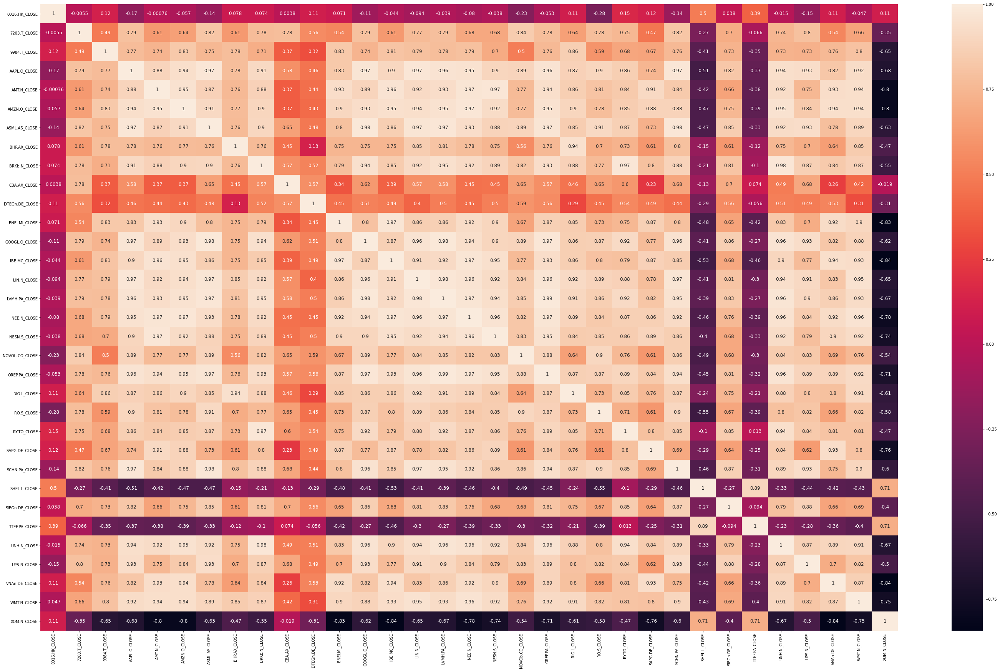

<Figure size 432x288 with 0 Axes>

In [178]:
corr = data_5.corr()
sns.heatmap(corr, xticklabels=corr.columns.values, yticklabels=corr.columns.values, annot=True, annot_kws={'size':12})
heat_map=plt.gcf()
heat_map.set_size_inches(50, 30)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.show()
plt.savefig('Correlation_matrix')

In [172]:
#Putting the data from the correlation test into our SQL data base
data_5.to_sql('Data Correlation test', con = sqlite3.connect(r"Z:\06_ZHAW\03_2. Semester\03_Advanced Quantitative Methods\00_AQM\Stock_analysis_data_base.db"),
 schema=None, if_exists='replace', index=True, index_label='Date', chunksize=None, dtype=None, method=None)

# Forecasting using Granger’s Causality

The Granger Causality test is used to determine whether or not one time series is useful for forecasting another.

This test uses the following null and alternative hypotheses:

Null Hypothesis (H0): Time series x does not Granger-cause time series y

Alternative Hypothesis (HA): Time series x Granger-causes time series y

The term “Granger-causes” means that knowing the value of time series x at a certain lag is useful for predicting the value of time series y at a later time period.

This test produces an F test statistic with a corresponding p-value. If the p-value is less than a certain significance level (i.e. α = .05), then we can reject the null hypothesis and conclude that we have sufficient evidence to say that time series x Granger-causes time series y.

We can use the grangercausalitytests() function from the statsmodels package to perform a Granger-Causality test in Python:

# Interpretation
Granger’s causality Tests the null hypothesis that the coefficients of past values in the regression equation is zero. So, if the p-value obtained from the test is lesser than the significance level of 0.05, then, you can safely reject the null hypothesis.

In [173]:
dataset = data_5

In [174]:
from statsmodels.tsa.stattools import grangercausalitytests
maxlag=12

test = 'ssr-chi2test'

def grangers_causality_matrix(data, variables, test = 'ssr_chi2test', verbose=False):

    dataset = pd.DataFrame(np.zeros((len(variables), len(variables))), columns=variables, index=variables)

    for c in dataset.columns:
        for r in dataset.index:
            test_result = grangercausalitytests(data[[r,c]], maxlag=maxlag, verbose=False)
            p_values = [round(test_result[i+1][0][test][1],4) for i in range(maxlag)]
            if verbose: print(f'Y = {r}, X = {c}, P Values = {p_values}')

            min_p_value = np.min(p_values)
            dataset.loc[r,c] = min_p_value

    dataset.columns = [var + '_X' for var in variables]

    dataset.index = [var + '_Y' for var in variables]

    return dataset

grangers_causality_matrix(dataset, variables = dataset.columns)

,0016.HK_CLOSE_X,7203.T_CLOSE_X,9984.T_CLOSE_X,AAPL.O_CLOSE_X,AMT.N_CLOSE_X,AMZN.O_CLOSE_X,ASML.AS_CLOSE_X,BHP.AX_CLOSE_X,BRKb.N_CLOSE_X,CBA.AX_CLOSE_X,...,SAPG.DE_CLOSE_X,SCHN.PA_CLOSE_X,SHEL.L_CLOSE_X,SIEGn.DE_CLOSE_X,TTEF.PA_CLOSE_X,UNH.N_CLOSE_X,UPS.N_CLOSE_X,VNAn.DE_CLOSE_X,WMT.N_CLOSE_X,XOM.N_CLOSE_X
0016.HK_CLOSE_Y,1.0000,0.0411,0.3270,0.0008,0.0077,0.0062,0.0004,0.0603,0.0000,0.3669,...,0.0001,0.0000,0.0000,0.0001,0.0000,0.0011,0.0047,0.0062,0.2114,0.0000
7203.T_CLOSE_Y,0.2853,1.0000,0.0728,0.0000,0.0002,0.0000,0.0000,0.0291,0.0000,0.0000,...,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0005,0.0000,0.0000
9984.T_CLOSE_Y,0.7028,0.1320,1.0000,0.0000,0.0000,0.0000,0.0000,0.3091,0.0000,0.0005,...,0.0000,0.0000,0.0020,0.0000,0.0003,0.0001,0.0000,0.0000,0.0022,0.0000
AAPL.O_CLOSE_Y,0.0716,0.0746,0.0000,1.0000,0.0000,0.0004,0.0000,0.3374,0.0000,0.0224,...,0.0424,0.0024,0.0002,0.0001,0.0057,0.0001,0.0005,0.0030,0.0000,0.0006
AMT.N_CLOSE_Y,0.4246,0.1412,0.0000,0.0000,1.0000,0.0237,0.0000,0.0001,0.0000,0.0001,...,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0053,0.0000,0.0000,0.0080
AMZN.O_CLOSE_Y,0.2173,0.0098,0.0143,0.0039,0.0167,1.0000,0.0319,0.0111,0.0048,0.0105,...,0.0095,0.2860,0.0190,0.3189,0.0197,0.0669,0.0007,0.0019,0.2818,0.0005
ASML.AS_CLOSE_Y,0.2840,0.0036,0.0000,0.0000,0.0001,0.0000,1.0000,0.0391,0.3181,0.0003,...,0.5874,0.0000,0.0419,0.2142,0.0041,0.0002,0.0305,0.0032,0.0008,0.0002
BHP.AX_CLOSE_Y,0.0612,0.0890,0.0997,0.0000,0.0010,0.0000,0.0000,1.0000,0.0000,0.0012,...,0.0185,0.0000,0.0000,0.0000,0.0000,0.0002,0.0000,0.0786,0.0000,0.0000
BRKb.N_CLOSE_Y,0.0475,0.1224,0.0134,0.0019,0.0000,0.0000,0.0096,0.0290,1.0000,0.0340,...,0.2133,0.0001,0.0037,0.0010,0.0003,0.0000,0.0000,0.0002,0.0052,0.0866
CBA.AX_CLOSE_Y,0.3388,0.0204,0.0015,0.0099,0.0006,0.0925,0.0000,0.0012,0.0000,1.0000,...,0.0000,0.0000,0.0008,0.0000,0.0000,0.0000,0.0000,0.0077,0.0350,0.0000


The row are the response (y) and the columns are the predictor series (x).

In [175]:
grangers = pd.DataFrame(grangers_causality_matrix(dataset, variables = dataset.columns))
grangers.head()

,0016.HK_CLOSE_X,7203.T_CLOSE_X,9984.T_CLOSE_X,AAPL.O_CLOSE_X,AMT.N_CLOSE_X,AMZN.O_CLOSE_X,ASML.AS_CLOSE_X,BHP.AX_CLOSE_X,BRKb.N_CLOSE_X,CBA.AX_CLOSE_X,...,SAPG.DE_CLOSE_X,SCHN.PA_CLOSE_X,SHEL.L_CLOSE_X,SIEGn.DE_CLOSE_X,TTEF.PA_CLOSE_X,UNH.N_CLOSE_X,UPS.N_CLOSE_X,VNAn.DE_CLOSE_X,WMT.N_CLOSE_X,XOM.N_CLOSE_X
0016.HK_CLOSE_Y,1.0000,0.0411,0.3270,0.0008,0.0077,0.0062,0.0004,0.0603,0.0,0.3669,...,0.0001,0.0000,0.0000,0.0001,0.0000,0.0011,0.0047,0.0062,0.2114,0.0000
7203.T_CLOSE_Y,0.2853,1.0000,0.0728,0.0000,0.0002,0.0000,0.0000,0.0291,0.0,0.0000,...,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0005,0.0000,0.0000
9984.T_CLOSE_Y,0.7028,0.1320,1.0000,0.0000,0.0000,0.0000,0.0000,0.3091,0.0,0.0005,...,0.0000,0.0000,0.0020,0.0000,0.0003,0.0001,0.0000,0.0000,0.0022,0.0000
AAPL.O_CLOSE_Y,0.0716,0.0746,0.0000,1.0000,0.0000,0.0004,0.0000,0.3374,0.0,0.0224,...,0.0424,0.0024,0.0002,0.0001,0.0057,0.0001,0.0005,0.0030,0.0000,0.0006
AMT.N_CLOSE_Y,0.4246,0.1412,0.0000,0.0000,1.0000,0.0237,0.0000,0.0001,0.0,0.0001,...,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0053,0.0000,0.0000,0.0080


In [176]:
#Putting the data from the grangers causality into our SQL data base
grangers.to_sql('Grangers causality', con = sqlite3.connect(r"Z:\06_ZHAW\03_2. Semester\03_Advanced Quantitative Methods\00_AQM\Stock_analysis_data_base.db"),
 schema=None, if_exists='replace', index=True, index_label='Date', chunksize=None, dtype=None, method=None)

# THE END